# **Data cleansing - "fruit.csv"**

## **Import relevant libraries**

In [ ]:
import pandas as pd
from sklearn import linear_model
from sklearn.preprocessing import MinMaxScaler
import statsmodels.api as sm
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.impute import SimpleImputer
#from cleaning_model_beans_table import choosing_the_K,clustering_and_replace_missing_value

## **Importing the csv file & checking it**

In [ ]:
df = pd.read_csv('/content/fruit_v2.csv')

In [ ]:
# Set display options to show all columns
pd.set_option('display.max_columns', None)
pd.set_option('display.expand_frame_repr', False)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5159 entries, 0 to 5158
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Length                3278 non-null   float64
 1   Breadth               3274 non-null   float64
 2   Weight                1217 non-null   float64
 3   Length breadth ratio  1353 non-null   float64
 4   Notes                 630 non-null    object 
 5   Size                  485 non-null    object 
 6   Shape                 3021 non-null   object 
 7   Rugosity              3841 non-null   object 
 8   Ridge desc            474 non-null    object 
 9   Husk thickness        1021 non-null   object 
 10  Colour                3529 non-null   object 
 11  Basal constriction    3059 non-null   object 
 12  Apex form             3020 non-null   object 
 13  Husk weight           273 non-null    float64
 14  Furrow depth          671 non-null    object 
 15  Hardness             

In [ ]:
df.head()

,Length,Breadth,Weight,Length breadth ratio,Notes,Size,Shape,Rugosity,Ridge desc,Husk thickness,Colour,Basal constriction,Apex form,Husk weight,Furrow depth,Hardness,Info,Pods per tree,Furrow desc,Accession,Clone name + Refcode
0,156.1,76.4,382.2,2.0,20 pods sampled,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,AMAZ 15 /15_PAL92A
1,140.8,88.6,460.9,1.6,18 pods sampled,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,AMAZ 2 /1_PAL92A
2,154.8,88.9,548.0,1.7,10 pods sampled,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,APA 4_PAL92A
3,172.7,NaN,490.4,NaN,19 pods sampled,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,BE 10_PAL92A
4,171.3,84.2,543.2,2.0,19 pods sampled,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CAS 1_PAL92A


In [ ]:
#Calculating missing percentage on each column

missing_percentage = df.isnull().mean() * 100
missing_info = pd.DataFrame({
      'Column': missing_percentage.index,
      'Missing Percentage': missing_percentage.values })

print(missing_info.sort_values(by=['Missing Percentage']))

                  Column  Missing Percentage
20  Clone name + Refcode            0.000000
7               Rugosity           25.547587
10                Colour           31.595270
0                 Length           36.460554
1                Breadth           36.538089
11    Basal constriction           40.705563
6                  Shape           41.442140
12             Apex form           41.461524
18           Furrow desc           57.433611
16                  Info           58.751696
15              Hardness           61.387866
3   Length breadth ratio           73.773987
2                 Weight           76.410157
9         Husk thickness           80.209343
14          Furrow depth           86.993603
4                  Notes           87.788331
5                   Size           90.598953
8             Ridge desc           90.812173
17         Pods per tree           93.370808
13           Husk weight           94.708277
19             Accession           98.584997


## **Let's start dropping columns with a certian threshold of missing values**

### Let's select a threshold of 80%, but first, let's create a copy of the dataframe:

In [ ]:
df_copy_1 = df

In [ ]:
# Set the threshold for dropping columns
threshold = 80

# Identify columns with missing percentage greater than the threshold
columns_to_drop = missing_info[missing_info['Missing Percentage'] > threshold]['Column']

# Drop the identified columns from the DataFrame
df_copy_1 = df_copy_1.drop(columns=columns_to_drop)

In [ ]:
# Display the DataFrame after dropping columns
df_copy_1.info()
df_copy_1.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5159 entries, 0 to 5158
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Length                3278 non-null   float64
 1   Breadth               3274 non-null   float64
 2   Weight                1217 non-null   float64
 3   Length breadth ratio  1353 non-null   float64
 4   Shape                 3021 non-null   object 
 5   Rugosity              3841 non-null   object 
 6   Colour                3529 non-null   object 
 7   Basal constriction    3059 non-null   object 
 8   Apex form             3020 non-null   object 
 9   Hardness              1992 non-null   object 
 10  Info                  2128 non-null   object 
 11  Furrow desc           2196 non-null   object 
 12  Clone name + Refcode  5159 non-null   object 
dtypes: float64(4), object(9)
memory usage: 524.1+ KB


,Length,Breadth,Weight,Length breadth ratio,Shape,Rugosity,Colour,Basal constriction,Apex form,Hardness,Info,Furrow desc,Clone name + Refcode
0,156.1,76.4,382.2,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,AMAZ 15 /15_PAL92A
1,140.8,88.6,460.9,1.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,AMAZ 2 /1_PAL92A
2,154.8,88.9,548.0,1.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,APA 4_PAL92A
3,172.7,NaN,490.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,BE 10_PAL92A
4,171.3,84.2,543.2,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CAS 1_PAL92A


In [ ]:
# Let's see on the remaining columns what are the missing percentages

missing_percentage = df_copy_1.isnull().mean() * 100
  # Create a DataFrame to display the results
missing_info = pd.DataFrame({
      'Column': missing_percentage.index,
      'Missing Percentage': missing_percentage.values })

print(missing_info.sort_values(by=['Missing Percentage']))

                  Column  Missing Percentage
12  Clone name + Refcode            0.000000
5               Rugosity           25.547587
6                 Colour           31.595270
0                 Length           36.460554
1                Breadth           36.538089
7     Basal constriction           40.705563
4                  Shape           41.442140
8              Apex form           41.461524
11           Furrow desc           57.433611
10                  Info           58.751696
9               Hardness           61.387866
3   Length breadth ratio           73.773987
2                 Weight           76.410157


## **Remove duplications of 'Clone name + Ref Code' coloumn - Currently disabled**

In [ ]:
#df_copy_1 = df_copy_1.drop_duplicates(subset=["Clone name + Refcode"])

In [ ]:
# Resetting the indexes
#df_copy_1.reset_index(drop=True, inplace=True)

In [ ]:
#df_copy_1.info()

## **EDA: Distributions, Correlations & Statistical Tests (before dealing with outliers & replacing missing values)**

### Let's check the distributions of a selected features:

Let's begin with the numeric features and see if the distibution looks Normal

In [ ]:
# Let's define a function for numeric columns distributions

def numeric_plot_graph(df, numeric_columns):
  for column in numeric_columns:
    # Plot the distribution
    plt.figure(figsize=(10, 6))
    ax = sns.histplot(data=df, x=column, kde=True, color='skyblue')
    ax.lines[0].set_color('red')  # Set the color of the KDE curve directly

    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Density')

    plt.show()

In [ ]:
# Let's define the numeric columns

numeric_columns = df_copy_1.copy()[df_copy_1.select_dtypes(include='float64').columns]

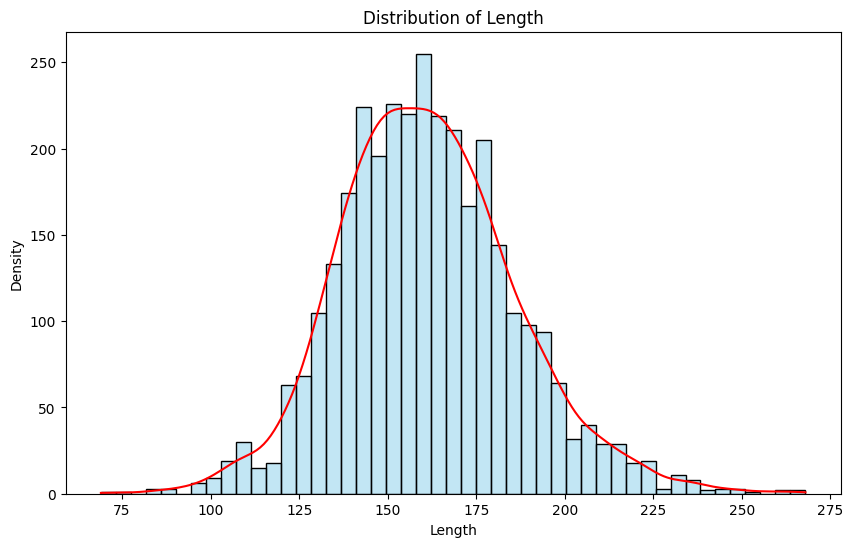

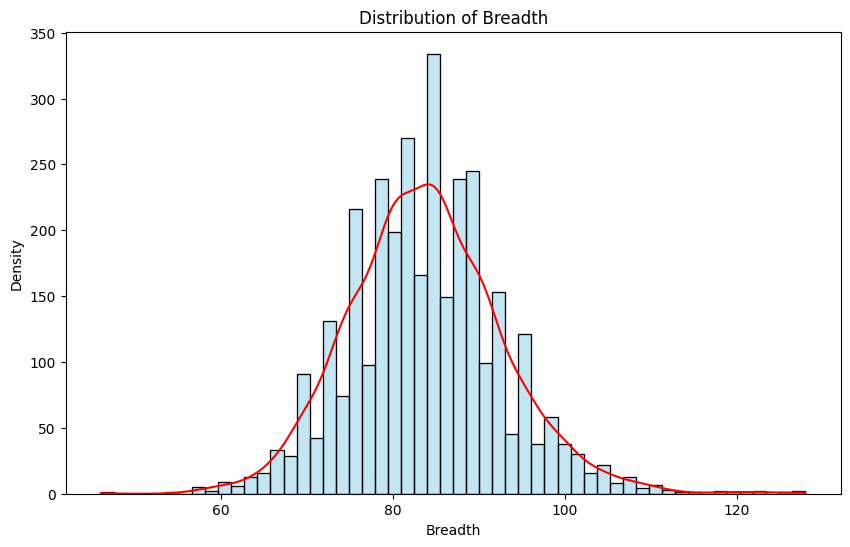

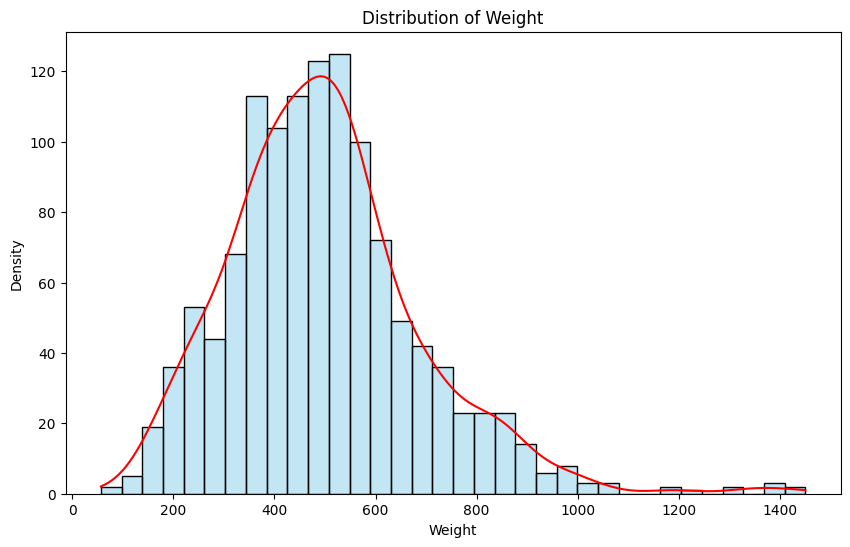

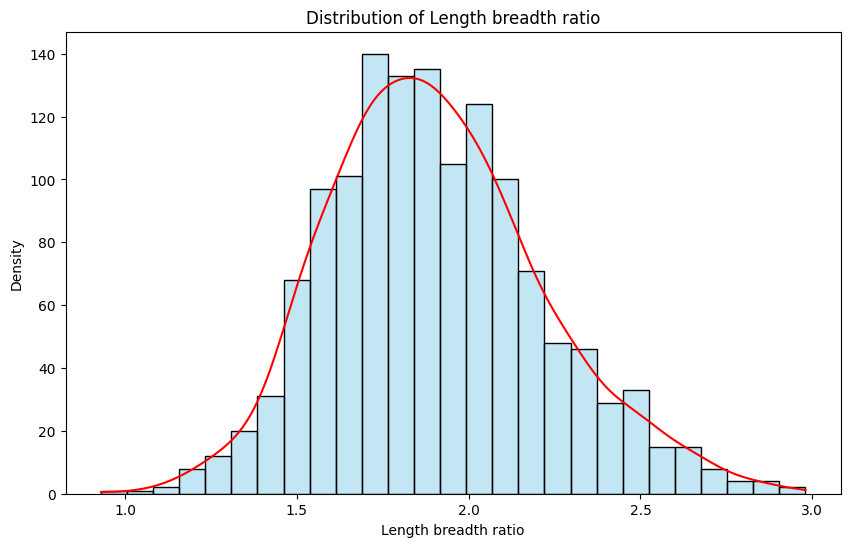

In [ ]:
# Let's use the function

numeric_plot_graph(df_copy_1, numeric_columns)

In [ ]:
# Let's sort the values to get a cumulative distribution function
# We can spot numeric outliers

def numeric_plot_graph_2(df, numeric_columns):
    for column in numeric_columns:
        # Sort the data for CDF
        sorted_data = np.sort(df[column])

        # Calculate the cumulative distribution function
        cdf = np.linspace(0, 1, len(sorted_data))

        # Plot the CDF
        plt.figure(figsize=(10, 6))
        plt.plot(sorted_data, cdf, color='skyblue', label='Empirical CDF')
        plt.title(f'Empirical CDF of {column}')
        plt.xlabel(column)
        plt.ylabel('Cumulative Probability')
        plt.legend()
        plt.show()

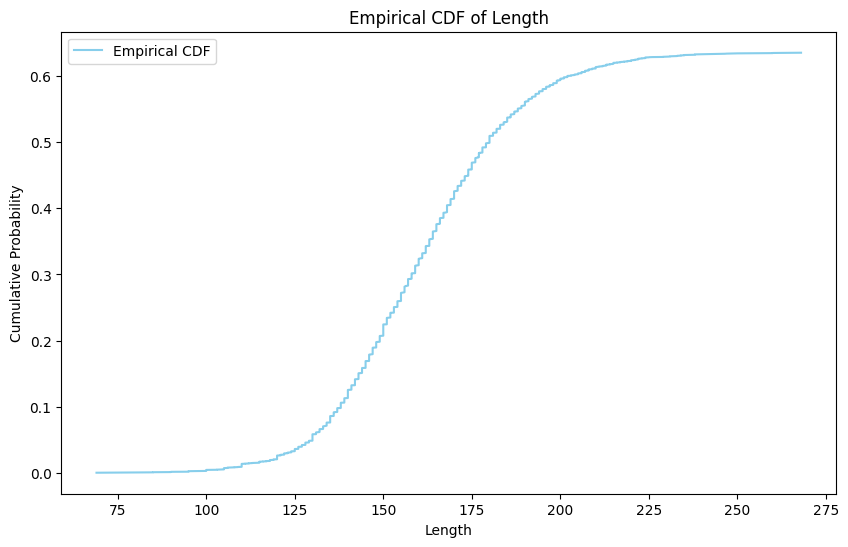

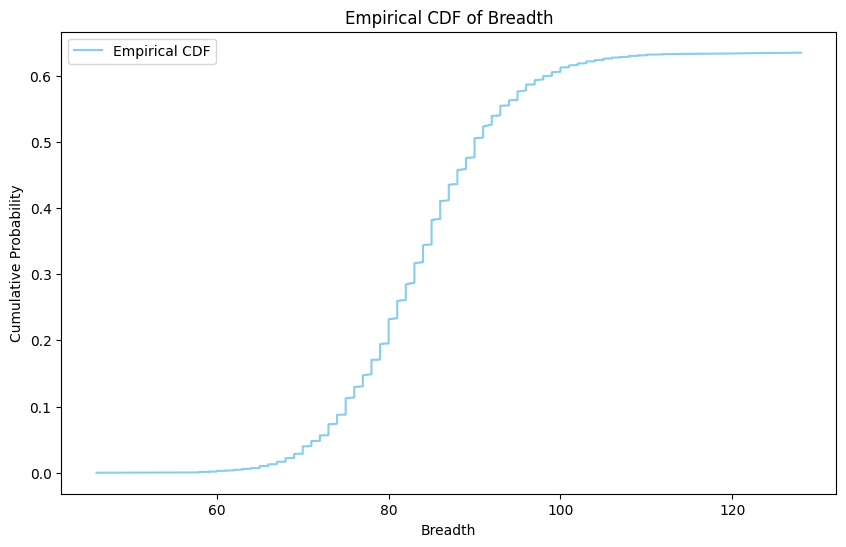

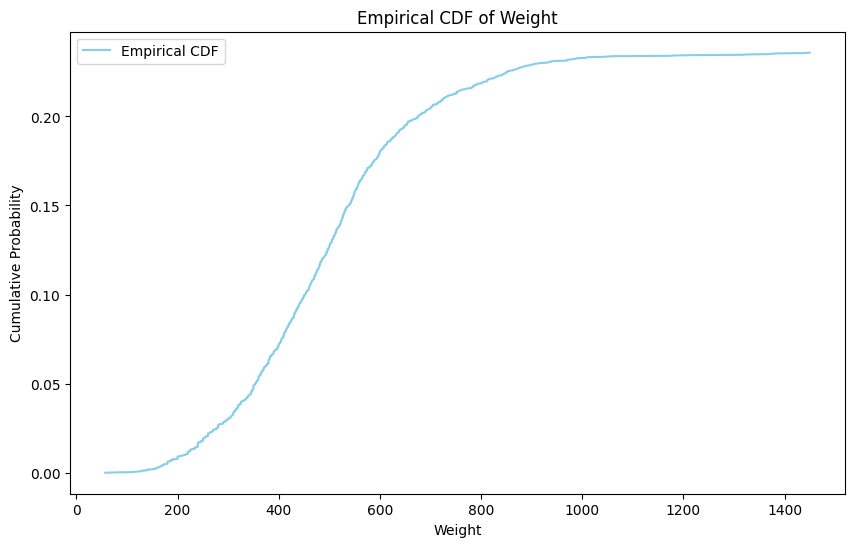

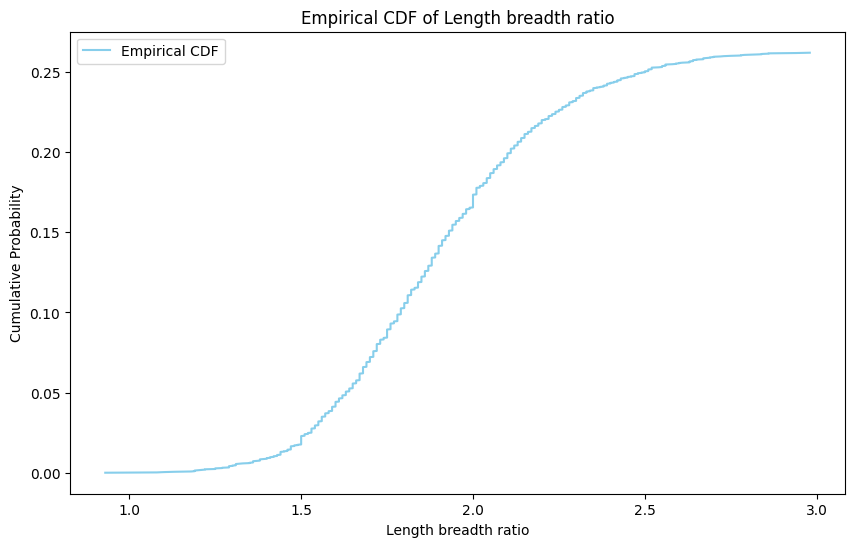

In [ ]:
# Let's use the function

numeric_plot_graph_2(df_copy_1, numeric_columns)

In [ ]:
# Let's see the numeric columns in a boxplot

In [ ]:
def boxplot_for_numeric_columns(df, numeric_columns):
    for column in numeric_columns:
        sns.boxplot(y=df[column])
        plt.show()

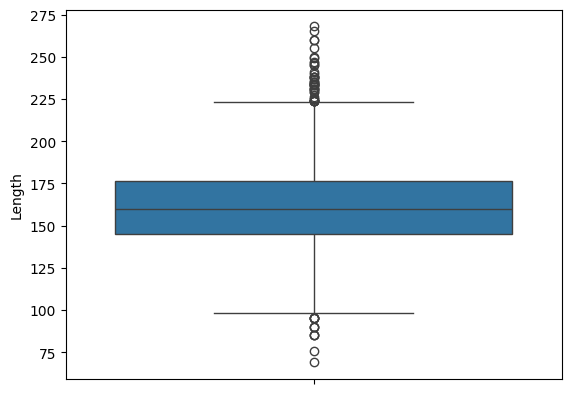

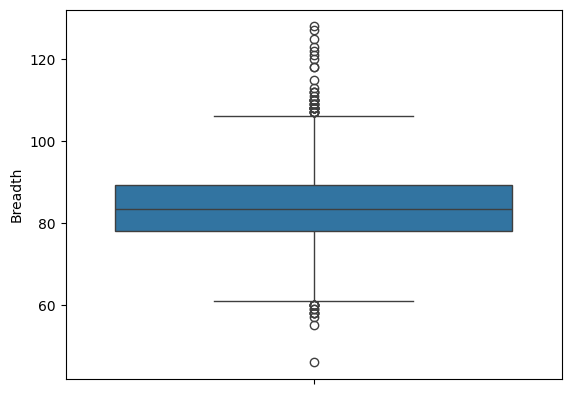

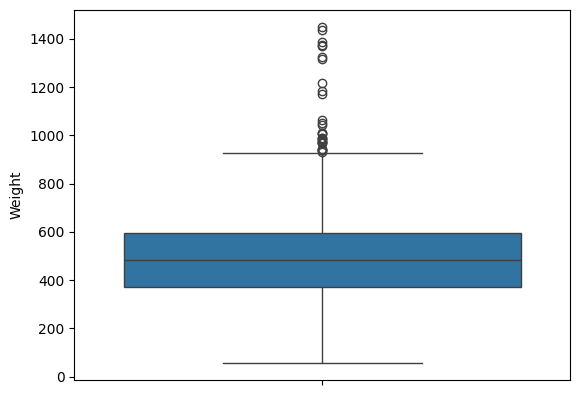

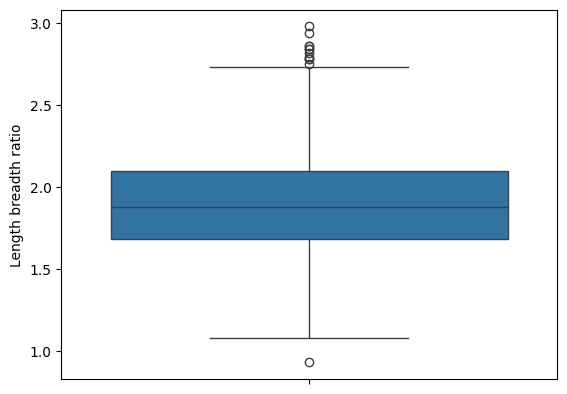

In [ ]:
boxplot_for_numeric_columns(df_copy_1, numeric_columns)

Let's continue with the categorical features

In [ ]:
# Let's define a function for categorical columns distributions

def categorical_plot_graph(df, categorical_columns):
  for column in categorical_columns:
    # Plot the distribution of categorical values
    plt.figure(figsize=(20, 6))
    sns.countplot(data=df, x=column, palette='pastel')
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Count')
    plt.show()

In [ ]:
# Let's define the categorical columns

categorical_columns = df_copy_1.copy()[df_copy_1.select_dtypes(include='object').columns]

# Exclude specific columns
exclude_columns = ["Info", "Clone name + Refcode"]
categorical_columns = [col for col in categorical_columns if col not in exclude_columns]

In [ ]:
print(categorical_columns)

['Shape', 'Rugosity', 'Colour', 'Basal constriction', 'Apex form', 'Hardness', 'Furrow desc']


<ipython-input-293-96e390e00927>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=column, palette='pastel')


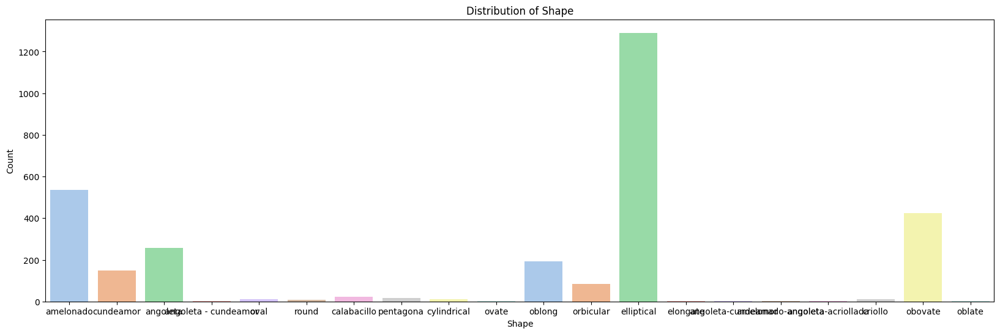

<ipython-input-293-96e390e00927>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=column, palette='pastel')


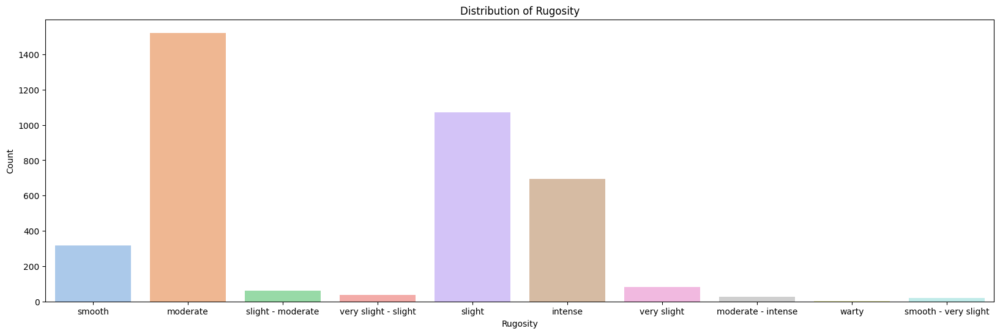

<ipython-input-293-96e390e00927>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=column, palette='pastel')


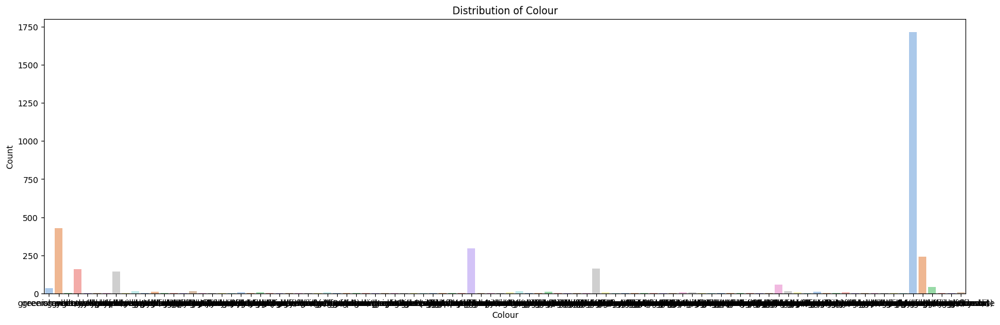

<ipython-input-293-96e390e00927>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=column, palette='pastel')


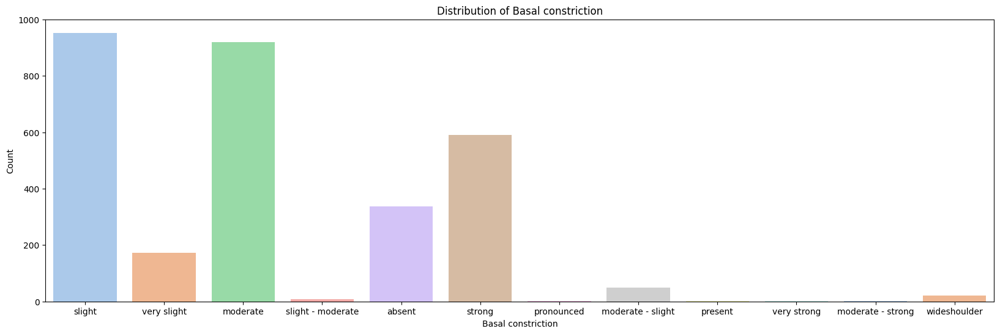

<ipython-input-293-96e390e00927>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=column, palette='pastel')


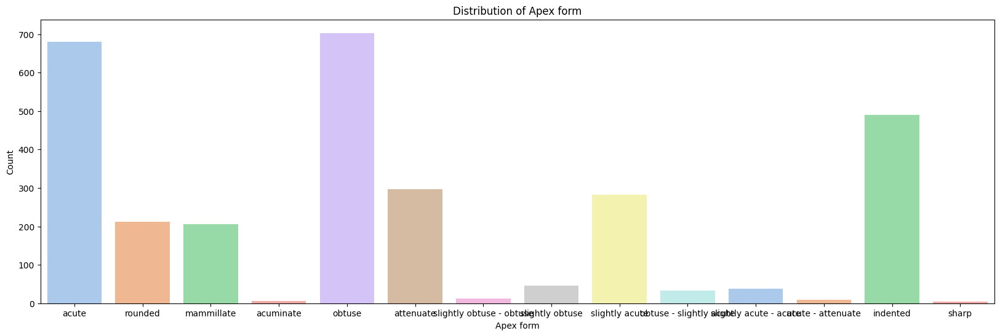

<ipython-input-293-96e390e00927>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=column, palette='pastel')


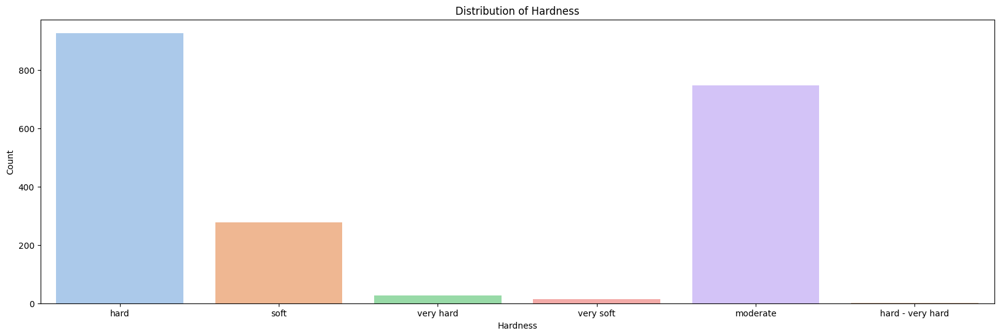

<ipython-input-293-96e390e00927>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=column, palette='pastel')


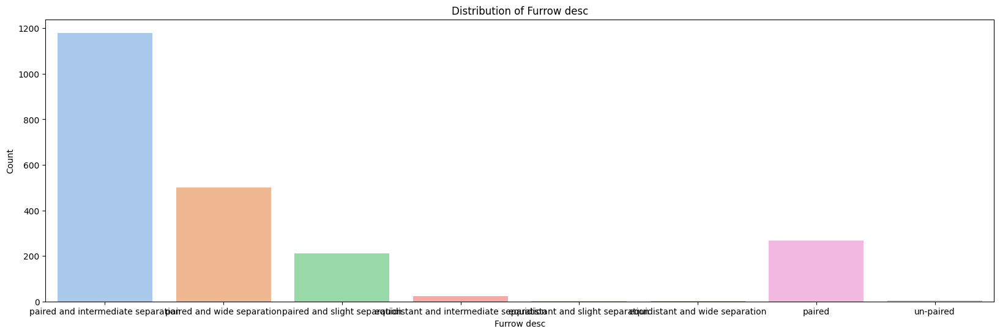

In [ ]:
# Let's use the function

categorical_plot_graph(df_copy_1, categorical_columns)

### Correlations & Statistical Tests

Let's check the correlations bewtween the features

<ipython-input-297-e03ea20b7d5a>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df_copy_1.corr()


                        Length   Breadth    Weight  Length breadth ratio
Length                1.000000  0.471823  0.801332              0.796444
Breadth               0.471823  1.000000  0.791445             -0.106214
Weight                0.801332  0.791445  1.000000              0.393805
Length breadth ratio  0.796444 -0.106214  0.393805              1.000000


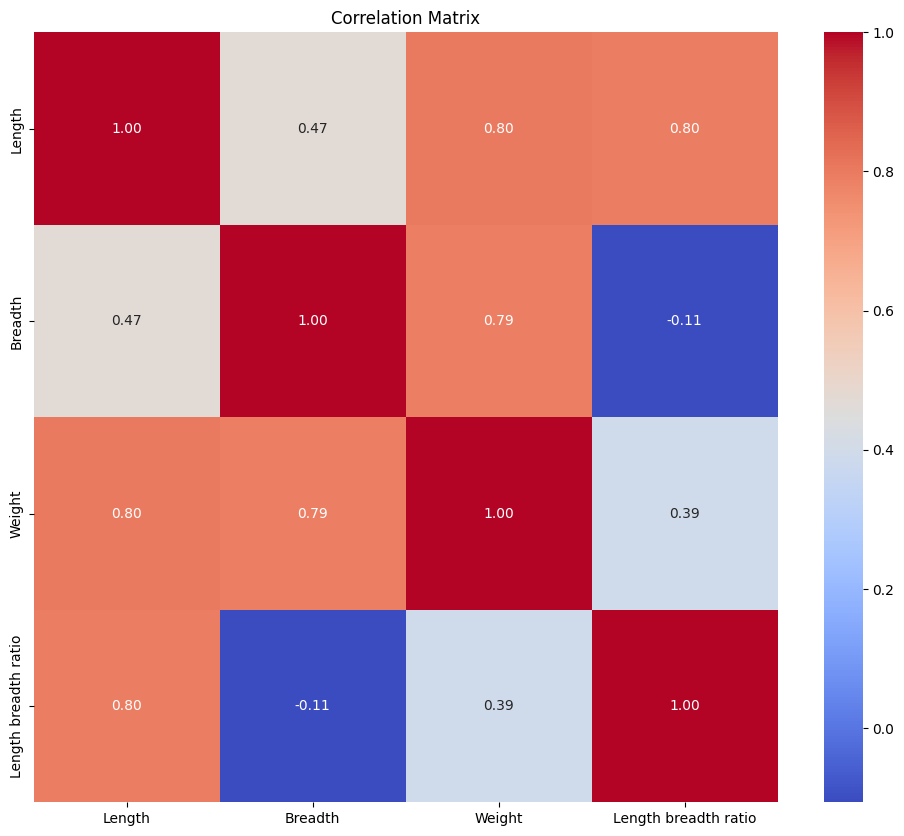

In [ ]:
correlation_matrix = df_copy_1.corr()

# Display the correlation matrix
print(correlation_matrix)

# Create a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")

plt.title('Correlation Matrix')
plt.show()

Let's take the features with the higher correlation and display them in a scatter plot

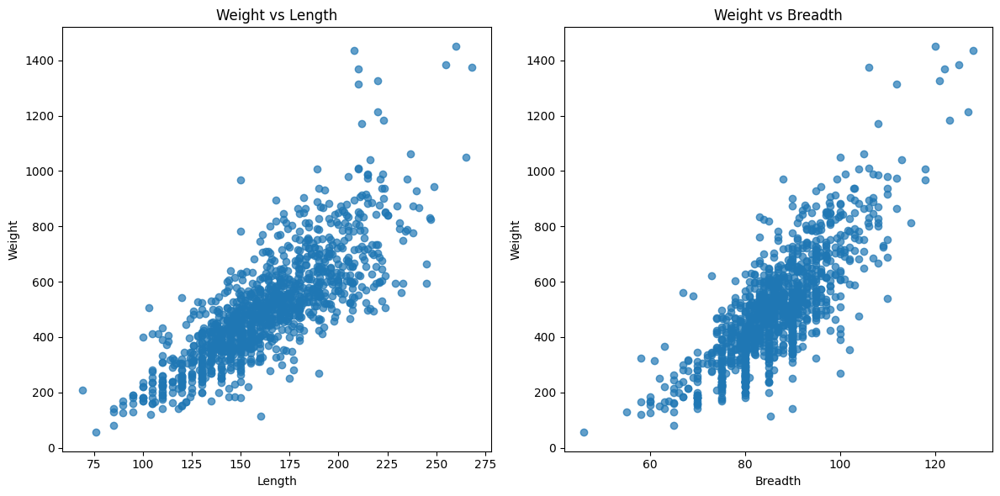

In [ ]:
# Scatter plot for 'Weight' vs 'Length' and 'Weight' vs 'Breadth'
plt.figure(figsize=(12, 6))

# Scatter plot for 'Weight' vs 'Length'
plt.subplot(1, 2, 1)
plt.scatter(df_copy_1['Length'], df_copy_1['Weight'], alpha=0.7)
plt.title('Weight vs Length')
plt.xlabel('Length')
plt.ylabel('Weight')

# Scatter plot for 'Weight' vs 'Breadth'
plt.subplot(1, 2, 2)
plt.scatter(df_copy_1['Breadth'], df_copy_1['Weight'], alpha=0.7)
plt.title('Weight vs Breadth')
plt.xlabel('Breadth')
plt.ylabel('Weight')

plt.tight_layout()  # Ensures proper spacing between subplots
plt.show()

Let's explore the data by visualizing it by Scatterplot Matrix

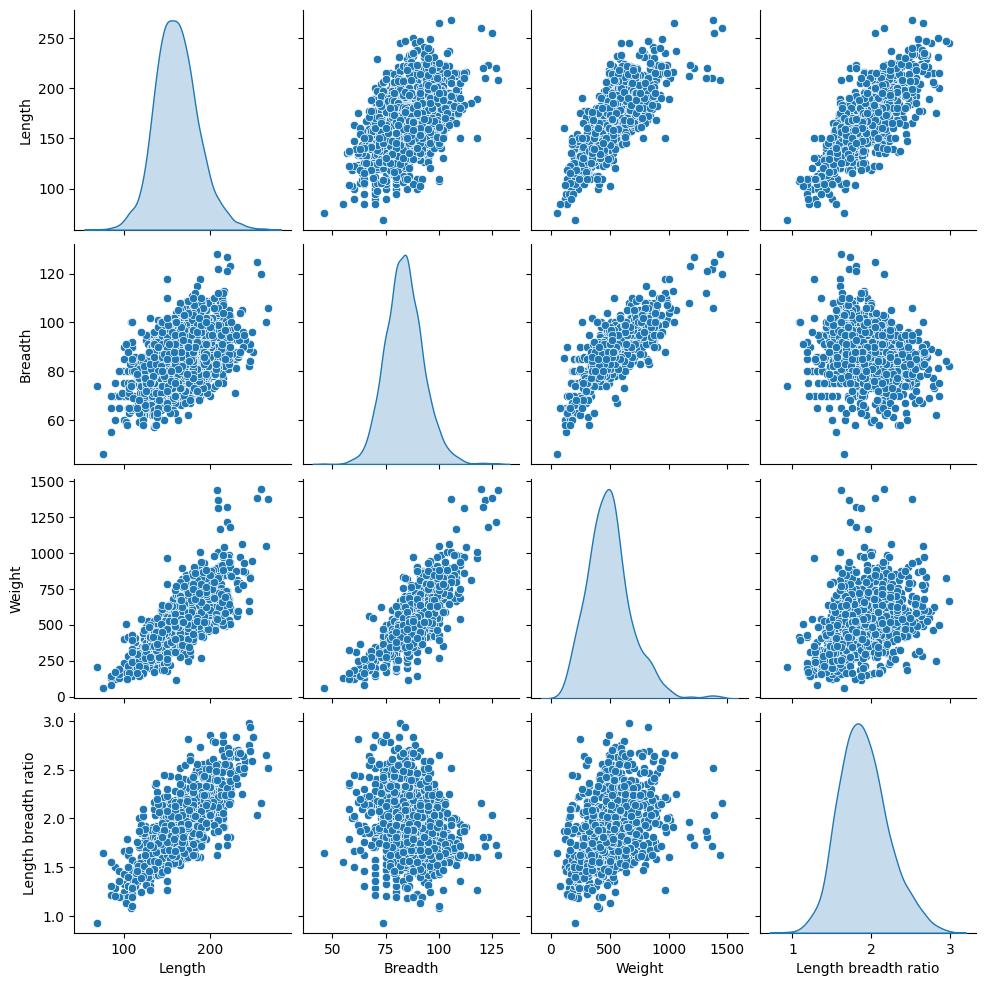

In [ ]:
sns.pairplot(df_copy_1, diag_kind='kde')
plt.show()

Now, let's perform statistical tests

We'll begin with One-Way ANOVA Test

In [ ]:
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from scipy.stats import norm,f_oneway

In [ ]:
def Anova_test(df,category,target):
  # Group numerical data by categories in 'Colour' column
  df_filtered = df.dropna(subset=[target])
  df_filtered=df_filtered.dropna(subset=[category])
  groups = {}
  for sub_category, data in df_filtered.groupby(category)[target]:
    groups[sub_category] = data.values
  # Extract numerical data arrays from the dictionary
  data_arrays = list(groups.values())
  # Perform ANOVA test
  f_statistic, p_value = f_oneway(*data_arrays)
  # Print the results
  print("ANOVA Test Results:")
  print("F-statistic:", f_statistic)
  print("p-value:", p_value)
  # Interpret the results
  if p_value < 0.05:
    print("Reject the null hypothesis. There is significant evidence to suggest that there are differences in the means of 'Number' based on 'Colour'.")
    print()
    print()
    # Perform Tukey HSD test
    tukey_results = pairwise_tukeyhsd(df_filtered[target], df_filtered[category])
    # Print the Tukey HSD test results
    print("\nTukey HSD Test Results:")
    print(tukey_results)

  else:
    print("Fail to reject the null hypothesis. There is not enough evidence to suggest that there are differences in the means of 'Number' based on 'Colour'.")

In [ ]:
Anova_test(df_copy_1,'Shape','Weight')

ANOVA Test Results:
F-statistic: 1.3821006214656788
p-value: 0.17721983644095704
Fail to reject the null hypothesis. There is not enough evidence to suggest that there are differences in the means of 'Number' based on 'Colour'.


In [ ]:
Anova_test(df_copy_1,'Rugosity','Length')

ANOVA Test Results:
F-statistic: 56.51544471452981
p-value: 5.268312516075359e-86
Reject the null hypothesis. There is significant evidence to suggest that there are differences in the means of 'Number' based on 'Colour'.



Tukey HSD Test Results:
               Multiple Comparison of Means - Tukey HSD, FWER=0.05                
       group1               group2        meandiff p-adj   lower    upper   reject
----------------------------------------------------------------------------------
             intense             moderate -13.6004    0.0 -17.6743  -9.5264   True
             intense   moderate - intense -12.6748 0.1412 -27.1412   1.7916  False
             intense               slight -23.4458    0.0 -27.6348 -19.2569   True
             intense    slight - moderate -25.3307    0.0 -35.4439 -15.2174   True
             intense               smooth -25.1217    0.0 -33.1023 -17.1412   True
             intense smooth - very slight -34.6089 0.0027 -61.8721  -7.3457   True
    

In [ ]:
Anova_test(df_copy_1,'Basal constriction','Weight')

ANOVA Test Results:
F-statistic: 12.97641350938679
p-value: 1.1867776936825322e-19
Reject the null hypothesis. There is significant evidence to suggest that there are differences in the means of 'Number' based on 'Colour'.



Tukey HSD Test Results:
              Multiple Comparison of Means - Tukey HSD, FWER=0.05               
      group1            group2       meandiff p-adj    lower      upper   reject
--------------------------------------------------------------------------------
           absent          moderate -141.0796    0.0  -205.9342   -76.225   True
           absent moderate - slight  -41.4379  0.976  -153.3112   70.4354  False
           absent moderate - strong -261.3773  0.938  -869.5095  346.7549  False
           absent        pronounced -392.3773 0.5663 -1000.5095  215.7549  False
           absent            slight -154.8243    0.0  -204.4863 -105.1622   True
           absent slight - moderate -217.9328 0.0277  -423.5816  -12.2841   True
           absent    

In [ ]:
Anova_test(df_copy_1,'Basal constriction','Length')

ANOVA Test Results:
F-statistic: 17.27650971378757
p-value: 6.9864754841373995e-31
Reject the null hypothesis. There is significant evidence to suggest that there are differences in the means of 'Number' based on 'Colour'.



Tukey HSD Test Results:
             Multiple Comparison of Means - Tukey HSD, FWER=0.05             
      group1            group2      meandiff p-adj    lower    upper   reject
-----------------------------------------------------------------------------
           absent          moderate  -5.0767 0.0398  -10.0401  -0.1134   True
           absent moderate - slight  15.1033 0.0187    1.2963  28.9102   True
           absent moderate - strong -19.5907 0.9991  -95.1265  55.9452  False
           absent        pronounced -34.5907 0.9281 -110.1265  40.9452  False
           absent            slight -10.8663    0.0  -15.8275  -5.9051   True
           absent slight - moderate -21.2573 0.2069  -46.7567    4.242  False
           absent            strong     1.79 0.9

In [ ]:
Anova_test(df_copy_1,'Rugosity','Weight')

ANOVA Test Results:
F-statistic: 15.322017097451868
p-value: 2.660878376686121e-21
Reject the null hypothesis. There is significant evidence to suggest that there are differences in the means of 'Number' based on 'Colour'.



Tukey HSD Test Results:
                 Multiple Comparison of Means - Tukey HSD, FWER=0.05                 
       group1               group2         meandiff p-adj    lower     upper   reject
-------------------------------------------------------------------------------------
             intense             moderate  -75.8811  0.003 -135.9536  -15.8086   True
             intense   moderate - intense -169.0214 0.0012  -295.838  -42.2048   True
             intense               slight -128.8138    0.0 -196.0426  -61.5851   True
             intense    slight - moderate -201.3278    0.0 -294.5896  -108.066   True
             intense               smooth -138.5026 0.0001 -230.1687  -46.8365   True
             intense smooth - very slight -144.4829 0.5704 -37

Let's continue with Normal distribution test for the nueric featues that seems like normal distribution

In [ ]:
# Define a Normal Distributon function

def if_Normal_ditribution(df,alpha):
  statistic, p_value = stats.kstest(df, 'norm')
  # Set the significance level (alpha)
  # Check the p-value against the significance level
  if p_value > alpha:
    return True
  else:
    return False

# Define the alpha
alpha = 0.5

In [ ]:
from scipy import stats

for column in numeric_columns:
    result = if_Normal_ditribution(df_copy_1[column], alpha)
    print(f"{column}: {str(result)}")

Length: False
Breadth: False
Weight: False
Length breadth ratio: False


In [ ]:
from scipy.stats import chi2_contingency

def chi_squared_test_from_dataframe(df, column1, column2):
    """
    Perform chi-squared test for independence of variables from columns of a DataFrame.

    Parameters:
        df (DataFrame): Pandas DataFrame containing the data.
        column1 (str): Name of the first column.
        column2 (str): Name of the second column.

    Returns:
        chi2 (float): The chi-squared test statistic.
        p_value (float): The p-value of the test.
        dof (int): Degrees of freedom.
        expected (ndarray): The expected frequencies under the null hypothesis.
    """
    observed = pd.crosstab(df[column1], df[column2]).values
    chi2, p_value, dof, expected = chi2_contingency(observed)
    return chi2, p_value, dof, expected

# Example usage:
# Create a sample DataFrame
data = {'Column1': [1, 2, 1, 2, 1],
        'Column2': [0, 0, 1, 1, 1]}
df = pd.DataFrame(data)

# Perform chi-squared test
chi2_statistic, p_value, degrees_of_freedom, expected_freq = chi_squared_test_from_dataframe(df, 'Column1', 'Column2')
print("Chi-squared test statistic:", chi2_statistic)
print("p-value:", p_value)
print("Degrees of freedom:", degrees_of_freedom)
print("Expected frequencies:", expected_freq)

Chi-squared test statistic: 0.0
p-value: 1.0
Degrees of freedom: 1
Expected frequencies: [[1.2 1.8]
 [0.8 1.2]]


As it looks, the numeric coulmns are not Normal distributed

## **Reducing the unique values of the categorical columns**

### First, let's remember what are the categrocial columns

In [ ]:
df_copy_2 = df_copy_1

In [ ]:
categorical_columns = df_copy_2.copy()[df_copy_2.select_dtypes(include='object').columns]

# Exclude specific columns
exclude_columns = ["Info", "Clone name + Refcode"]
categorical_columns = [col for col in categorical_columns if col not in exclude_columns]

In [ ]:
# Let's see what are the categorical columns

print(categorical_columns)

['Shape', 'Rugosity', 'Colour', 'Basal constriction', 'Apex form', 'Hardness', 'Furrow desc']


### 'Shape' column

In [ ]:
# Let's see what are the unique values in 'Shape' column
df_copy_2['Shape'].unique()

array([nan, 'amelonado', 'cundeamor', 'angoleta', 'angoleta - cundeamor',
       'oval', 'round', 'calabacillo', 'pentagona', 'cylindrical',
       'ovate', 'oblong', 'orbicular', 'elliptical', 'elongate',
       'angoleta-cundeamor', 'amelonado-angoleta', 'angoleta-acriollada',
       'criollo', 'obovate', 'oblate'], dtype=object)

In [ ]:
# Let's see the count of each value

shape_counts = df_copy_2['Shape'].value_counts()
print(shape_counts)

elliptical              1290
amelonado                536
obovate                  423
angoleta                 257
oblong                   192
cundeamor                150
orbicular                 83
calabacillo               23
pentagona                 18
oval                      12
criollo                   11
cylindrical               10
round                      7
oblate                     2
angoleta-cundeamor         2
angoleta - cundeamor       1
ovate                      1
elongate                   1
amelonado-angoleta         1
angoleta-acriollada        1
Name: Shape, dtype: int64


In [ ]:
# Let's replace value count of 9 or below to null

threshold = 9
value_counts = df_copy_2['Shape'].value_counts()

# Identify shapes with counts below the threshold
shapes_to_replace = value_counts[value_counts <= threshold].index

# Replace the values with NaN in the 'Shape' column
df_copy_2['Shape'] = df_copy_2['Shape'].where(~df_copy_2['Shape'].isin(shapes_to_replace), np.nan)

# Print the modified DataFrame
print(df_copy_2['Shape'].value_counts())


elliptical     1290
amelonado       536
obovate         423
angoleta        257
oblong          192
cundeamor       150
orbicular        83
calabacillo      23
pentagona        18
oval             12
criollo          11
cylindrical      10
Name: Shape, dtype: int64


In [ ]:
# Let's replace every 'oval' shape into 'elliptical'
df_copy_2['Shape'] = df_copy_2['Shape'].replace('oval', 'elliptical')

# Print the modified DataFrame
print(df_copy_2['Shape'].value_counts())


elliptical     1302
amelonado       536
obovate         423
angoleta        257
oblong          192
cundeamor       150
orbicular        83
calabacillo      23
pentagona        18
criollo          11
cylindrical      10
Name: Shape, dtype: int64


In [ ]:
df_copy_2['Shape'].unique()

array([nan, 'amelonado', 'cundeamor', 'angoleta', 'elliptical',
       'calabacillo', 'pentagona', 'cylindrical', 'oblong', 'orbicular',
       'criollo', 'obovate'], dtype=object)

### 'Rugosity' column

In [ ]:
# Let's see what are the unique values in 'Rugosity' column
df_copy_2['Rugosity'].unique()

array([nan, 'smooth', 'moderate', 'slight - moderate',
       'very slight - slight', 'slight', 'intense', 'very slight',
       'moderate - intense', 'warty', 'smooth - very slight'],
      dtype=object)

In [ ]:
# Let's see the count of each value

rugosity_counts = df_copy_2['Rugosity'].value_counts()
print(rugosity_counts)

moderate                1522
slight                  1073
intense                  695
smooth                   318
very slight               82
slight - moderate         63
very slight - slight      37
moderate - intense        28
smooth - very slight      19
warty                      4
Name: Rugosity, dtype: int64


In [ ]:
# Let's replace value count of 9 or below to null

threshold = 9
value_counts = df_copy_2['Rugosity'].value_counts()

# Identify shapes with counts below the threshold
rugosity_to_replace = value_counts[value_counts <= threshold].index

# Replace the values with NaN in the 'Shape' column
df_copy_2['Rugosity'] = df_copy_2['Rugosity'].where(~df_copy_2['Rugosity'].isin(rugosity_to_replace), np.nan)

# Print the modified DataFrame
print(df_copy_2['Rugosity'].value_counts())

moderate                1522
slight                  1073
intense                  695
smooth                   318
very slight               82
slight - moderate         63
very slight - slight      37
moderate - intense        28
smooth - very slight      19
Name: Rugosity, dtype: int64


In [ ]:
# Replace values in the 'Rugosity' column
df_copy_2['Rugosity'] = df_copy_2['Rugosity'].replace({
    'smooth - very slight': 'smooth',
    'moderate - intense': 'intense',
    'very slight': 'slight',
    'very slight - slight': 'slight',
    'slight - moderate': 'slight'
})

# Print the modified DataFrame
print(df_copy_2['Rugosity'].value_counts())

moderate    1522
slight      1255
intense      723
smooth       337
Name: Rugosity, dtype: int64


### 'Colour' column

In [ ]:
# Let's see what are the unique values in the column
df_copy_2['Colour'].unique()

array([nan, 'green - white', 'green', 'white', 'red', 'green and yellow',
       'greenish yellow / yellow (ridge/furrow)', 'light red', 'yellow',
       'orange / yellowish orange (ridge/furrow)', 'orange',
       'dark purple / green (ridge/furrow)',
       'yellow and red / yellow (ridge/furrow)',
       'purple / light green (ridge/furrow)',
       'yellowish red / reddish yellow (ridge/furrow)',
       'dark yellow / light yellow (ridge/furrow)', 'red and yellow',
       'yellow and red / yellow and red (ridge/furrow)',
       'yellow / dark yellow (ridge/furrow)',
       'dark red / yellow and red (ridge/furrow)',
       'red and yellow / yellow and red (ridge/furrow)',
       'yellow / yellow and red (ridge/furrow)',
       'yellow and red / yellow, red and green (ridge/furrow)',
       'yellow and red',
       'dark red and yellow / red and yellow (ridge/furrow)',
       'red and yellow / yellow (ridge/furrow)',
       'red / yellow (ridge/furrow)',
       'red / yellow and red

In [ ]:
# Set the max_rows option to None to display all rows
pd.set_option('display.max_rows', None)

# Let's see the count of each value

colour_counts = df_copy_2['Colour'].value_counts()
print(colour_counts)

anthocyanin absent                                                    1716
green                                                                  428
absent anthocyanin                                                     296
slight anthocyanin                                                     239
moderate anthocyanin                                                   161
red                                                                    158
yellow                                                                 144
intense green                                                           57
intense anthocyanin                                                     40
green - white                                                           33
light green                                                             16
orange                                                                  15
high / moderate anthocyanin (ridge/furrow)                              14
red and yellow           

In [ ]:
# Let's replace value count of 14 ot below to null

threshold = 14
value_counts = df_copy_2['Colour'].value_counts()

# Identify shapes with counts below the threshold
colour_to_replace = value_counts[value_counts <= threshold].index

# Replace the values with NaN in the 'Shape' column
df_copy_2['Colour'] = df_copy_2['Colour'].where(~df_copy_2['Colour'].isin(colour_to_replace), np.nan)

# Print the modified DataFrame
print(df_copy_2['Colour'].value_counts())

anthocyanin absent      1716
green                    428
absent anthocyanin       296
slight anthocyanin       239
moderate anthocyanin     161
red                      158
yellow                   144
intense green             57
intense anthocyanin       40
green - white             33
light green               16
orange                    15
Name: Colour, dtype: int64


In [ ]:
# Replace values in the 'Basal constriction' column
df_copy_2['Colour'] = df_copy_2['Colour'].replace({
    'absent anthocyanin': 'green',
    'anthocyanin absent': 'green',
    'intense green': 'green',
    'green - white': 'green',
    'light green': 'green',
    'slight anthocyanin': 'yellow',
    'moderate anthocyanin': 'orange',
    'intense anthocyanin': 'red',
})


# Print the modified DataFrame
print(df_copy_2['Colour'].value_counts())

green     2546
yellow     383
red        198
orange     176
Name: Colour, dtype: int64


### 'Basal constriction' column

In [ ]:
# Let's see what are the unique values in the column
df_copy_2['Basal constriction'].unique()

array([nan, 'slight', 'very slight', 'moderate', 'slight - moderate',
       'absent', 'strong', 'pronounced', 'moderate - slight', 'present',
       'very strong', 'moderate - strong', 'wideshoulder'], dtype=object)

In [ ]:
# Let's see the count of each value

bc_counts = df_copy_2['Basal constriction'].value_counts()
print(bc_counts)

slight               953
moderate             919
strong               590
absent               337
very slight          173
moderate - slight     50
wideshoulder          22
slight - moderate      9
moderate - strong      2
very strong            2
pronounced             1
present                1
Name: Basal constriction, dtype: int64


In [ ]:
# Let's replace value count of 1 to null

threshold = 1
value_counts = df_copy_2['Basal constriction'].value_counts()

# Identify shapes with counts below the threshold
bc_to_replace = value_counts[value_counts <= threshold].index

# Replace the values with NaN in the 'Shape' column
df_copy_2['Basal constriction'] = df_copy_2['Basal constriction'].where(~df_copy_2['Basal constriction'].isin(bc_to_replace), np.nan)

# Print the modified DataFrame
print(df_copy_2['Basal constriction'].value_counts())

slight               953
moderate             919
strong               590
absent               337
very slight          173
moderate - slight     50
wideshoulder          22
slight - moderate      9
very strong            2
moderate - strong      2
Name: Basal constriction, dtype: int64


In [ ]:
# Replace values in the 'Basal constriction' column
df_copy_2['Basal constriction'] = df_copy_2['Basal constriction'].replace({
    'very slight': 'slight',
    'moderate - slight': 'moderate',
    'slight - moderate': 'moderate',
    'moderate - strong': 'strong',
    'very strong': 'strong',
})

# Print the modified DataFrame
print(df_copy_2['Basal constriction'].value_counts())

slight          1126
moderate         978
strong           594
absent           337
wideshoulder      22
Name: Basal constriction, dtype: int64


### 'Apex form' column

In [ ]:
# Let's see what are the unique values in the column
df_copy_2['Apex form'].unique()

array([nan, 'acute', 'rounded', 'mammillate', 'acuminate', 'obtuse',
       'attenuate', 'slightly obtuse - obtuse', 'slightly obtuse',
       'slightly acute', 'obtuse - slightly acute',
       'slightly acute - acute', 'acute - attenuate', 'indented', 'sharp'],
      dtype=object)

In [ ]:
# Let's see the count of each value

af_counts = df_copy_2['Apex form'].value_counts()
print(af_counts)

obtuse                      703
acute                       680
indented                    490
attenuate                   297
slightly acute              283
rounded                     212
mammillate                  206
slightly obtuse              46
slightly acute - acute       38
obtuse - slightly acute      33
slightly obtuse - obtuse     13
acute - attenuate             9
acuminate                     6
sharp                         4
Name: Apex form, dtype: int64


In [ ]:
# Let's replace value count of 8 or below to null

threshold = 8
value_counts = df_copy_2['Apex form'].value_counts()

# Identify shapes with counts below the threshold
af_to_replace = value_counts[value_counts <= threshold].index

# Replace the values with NaN in the 'Shape' column
df_copy_2['Apex form'] = df_copy_2['Apex form'].where(~df_copy_2['Apex form'].isin(af_to_replace), np.nan)

# Print the modified DataFrame
print(df_copy_2['Apex form'].value_counts())

obtuse                      703
acute                       680
indented                    490
attenuate                   297
slightly acute              283
rounded                     212
mammillate                  206
slightly obtuse              46
slightly acute - acute       38
obtuse - slightly acute      33
slightly obtuse - obtuse     13
acute - attenuate             9
Name: Apex form, dtype: int64


In [ ]:
# Replace values in the 'Apex form' column
df_copy_2['Apex form'] = df_copy_2['Apex form'].replace({
    'slightly obtuse - obtuse': 'obtuse',
    'obtuse - slightly acute': 'obtuse',
    'slightly obtuse': 'obtuse',
    'acute - attenuate': 'acute',
    'slightly acute - acute': 'acute',
    'slightly acute': 'acute',
})

# Print the modified DataFrame
print(df_copy_2['Apex form'].value_counts())

acute         1010
obtuse         795
indented       490
attenuate      297
rounded        212
mammillate     206
Name: Apex form, dtype: int64


### 'Hardness' column

In [ ]:
# Let's see what are the unique values in the column
df_copy_2['Hardness'].unique()

array([nan, 'hard', 'soft', 'very hard', 'very soft', 'moderate',
       'hard - very hard'], dtype=object)

In [ ]:
# Let's see the count of each value

hardness_counts = df_copy_2['Hardness'].value_counts()
print(hardness_counts)

hard                926
moderate            746
soft                278
very hard            27
very soft            14
hard - very hard      1
Name: Hardness, dtype: int64


In [ ]:
# Replace values in the 'Hardness' column
df_copy_2['Hardness'] = df_copy_2['Hardness'].replace({
    'very hard': 'hard',
    'hard - very hard': 'hard',
    'very soft': 'soft',
})

# Print the modified DataFrame
print(df_copy_2['Hardness'].value_counts())

hard        954
moderate    746
soft        292
Name: Hardness, dtype: int64


### 'Furrow desc' column

In [ ]:
# Let's see what are the unique values in the column
df_copy_2['Furrow desc'].unique()

array([nan, 'paired and intermediate separation',
       'paired and wide separation', 'paired and slight separation',
       'equidistant and intermediate separation',
       'equidistant and slight separation',
       'equidistant and wide separation', 'paired', 'un-paired'],
      dtype=object)

In [ ]:
# Let's see the count of each value

fd_counts = df_copy_2['Furrow desc'].value_counts()
print(fd_counts)

paired and intermediate separation         1180
paired and wide separation                  502
paired                                      267
paired and slight separation                212
equidistant and intermediate separation      24
un-paired                                     5
equidistant and wide separation               3
equidistant and slight separation             3
Name: Furrow desc, dtype: int64


In [ ]:
# Let's replace value count of 8 or below to null

threshold = 20
value_counts = df_copy_2['Furrow desc'].value_counts()

# Identify shapes with counts below the threshold
fd_to_replace = value_counts[value_counts <= threshold].index

# Replace the values with NaN in the 'Shape' column
df_copy_2['Furrow desc'] = df_copy_2['Furrow desc'].where(~df_copy_2['Furrow desc'].isin(fd_to_replace), np.nan)

# Print the modified DataFrame
print(df_copy_2['Furrow desc'].value_counts())

paired and intermediate separation         1180
paired and wide separation                  502
paired                                      267
paired and slight separation                212
equidistant and intermediate separation      24
Name: Furrow desc, dtype: int64


Let's export a copy of this data frame (before replacing missing values)

In [ ]:
# Exporting the dataframe as csv
df_copy_2.to_csv('fruit_v3_WithMissingValues.csv', index=False)

## **Dealing with  numeric outliers**

### For the numeric outliers, we'll use IQR method

First, let's make a copy of the dataframe

In [ ]:
df_copy_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5159 entries, 0 to 5158
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Length                3278 non-null   float64
 1   Breadth               3274 non-null   float64
 2   Weight                1217 non-null   float64
 3   Length breadth ratio  1353 non-null   float64
 4   Shape                 3005 non-null   object 
 5   Rugosity              3837 non-null   object 
 6   Colour                3303 non-null   object 
 7   Basal constriction    3057 non-null   object 
 8   Apex form             3010 non-null   object 
 9   Hardness              1992 non-null   object 
 10  Info                  2128 non-null   object 
 11  Furrow desc           2185 non-null   object 
 12  Clone name + Refcode  5159 non-null   object 
dtypes: float64(4), object(9)
memory usage: 524.1+ KB


In [ ]:
def Filling_missing_values_by_IQR(df,columns_numbers):
    Q1= df[columns_numbers].quantile(0.25)
    Q3= df[columns_numbers].quantile(0.75)
    # Calculate IQR
    IQR = Q3 - Q1
    # Define boundaries for outliers
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    # Replace outliers with median
    for column in df.columns:
      if df[column].dtype=='float64' or df[column].dtype=='int64':
        df[column] = np.where((df[column] < lower_bound[column]) | (df[column] > upper_bound[column]), np.nan, df[column])

    return df

# Let's use the funciton
numeric_columns = [column for column in df_copy_2.columns if df_copy_2[column].dtype=='int64' or df_copy_2[column].dtype=='float64']
df_copy_2 = Filling_missing_values_by_IQR(df_copy_2, numeric_columns)

In [ ]:
# Display the DataFrame after replacing numeric outliers with null
df_copy_2.info()
df_copy_2.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5159 entries, 0 to 5158
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Length                3222 non-null   float64
 1   Breadth               3221 non-null   float64
 2   Weight                1188 non-null   float64
 3   Length breadth ratio  1341 non-null   float64
 4   Shape                 3005 non-null   object 
 5   Rugosity              3837 non-null   object 
 6   Colour                3303 non-null   object 
 7   Basal constriction    3057 non-null   object 
 8   Apex form             3010 non-null   object 
 9   Hardness              1992 non-null   object 
 10  Info                  2128 non-null   object 
 11  Furrow desc           2185 non-null   object 
 12  Clone name + Refcode  5159 non-null   object 
dtypes: float64(4), object(9)
memory usage: 524.1+ KB


,Length,Breadth,Weight,Length breadth ratio,Shape,Rugosity,Colour,Basal constriction,Apex form,Hardness,Info,Furrow desc,Clone name + Refcode
0,156.1,76.4,382.2,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,AMAZ 15 /15_PAL92A
1,140.8,88.6,460.9,1.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,AMAZ 2 /1_PAL92A
2,154.8,88.9,548.0,1.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,APA 4_PAL92A
3,172.7,NaN,490.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,BE 10_PAL92A
4,171.3,84.2,543.2,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CAS 1_PAL92A


It looks like within these 4 numeric columns, certain values were replaced with null. It means that there were actually numeric outliers. Let's continue.

## **Replacing missing values**

Let's make another copy of the dataframe

In [ ]:
df_copy_3 = df_copy_2

### Focusing on the numeric columns
We'll replace those columns by the following steps:

1.   Perform K Means and see what is the best K for the clusters
2.   For each cluster, Calculate the mean
3.   Replace the missing value with the mean



Let's define 2 functions

In [ ]:
def choosing_the_K(data):
  copy_data_numeric=data.copy()[data.select_dtypes(include='float64').columns]
  #fill missing values category and floating numbers:
  for col in copy_data_numeric.columns:
     mean_val = copy_data_numeric[col].median()
     copy_data_numeric[col].fillna(mean_val, inplace=True)

  # Step 2: Perform K-means clustering k=10
  inertia_=[]
  for k in range(1,11):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(copy_data_numeric)
    inertia_.append(kmeans.inertia_)

    #step 3 choosing the k
  plt.plot(range(1,11),inertia_)

In [ ]:
def clustering_and_replace_missing_values(df,k):
 copy_data=df.copy()[df.select_dtypes(include='float64').columns]
 #fill missing values category and floating numbers
 for col in copy_data.columns:
  mean_val = copy_data[col].median()
  copy_data[col].fillna(mean_val, inplace=True)
 kmeans = KMeans(n_clusters=k)
 kmeans.fit(copy_data)
 clusters= kmeans.labels_

# Step 3: Calculate cluster means
 cluster_means = []
 for i in range(k):
  cluster_data = copy_data[clusters == i]
  cluster_mean = np.mean(cluster_data, axis=0)
  cluster_means.append(cluster_mean)

# Step 4: Replace missing values with cluster means
 for index in copy_data.index:
  for column in copy_data.columns:
    if type(df.loc[index,column])!='object'and pd.isnull(df.loc[index,column]):
      cluster_mean = cluster_means[clusters[index]]
      df.loc[index, column] = cluster_mean[column]
 return df

Let's use the function

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

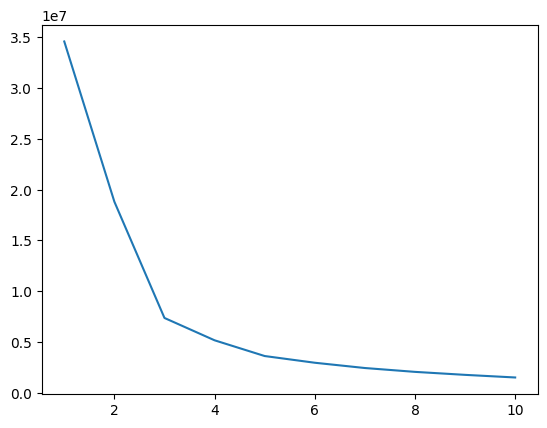

In [ ]:
choosing_the_K(df_copy_3)

It's seems for this data frame the best K (according to the elbow rule) is 3

In [ ]:
clustering_and_replace_missing_values(df_copy_3, 3)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


,Length,Breadth,Weight,Length breadth ratio,Shape,Rugosity,Colour,Basal constriction,Apex form,Hardness,Info,Furrow desc,Clone name + Refcode
0,156.100000,76.400000,382.200000,2.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,AMAZ 15 /15_PAL92A
1,140.800000,88.600000,460.900000,1.600000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,AMAZ 2 /1_PAL92A
2,154.800000,88.900000,548.000000,1.700000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,APA 4_PAL92A
3,172.700000,83.133355,490.400000,1.887300,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,BE 10_PAL92A
4,171.300000,84.200000,543.200000,2.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CAS 1_PAL92A
5,146.500000,75.200000,467.000000,1.900000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CATONGO_PAL92A
6,189.200000,87.500000,570.600000,2.200000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CC 10_PAL92A
7,166.200000,86.500000,531.800000,1.900000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CC 11_PAL92A
8,187.991450,92.817472,614.200000,2.044907,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CC 17_PAL92A
9,184.700000,93.500000,631.900000,2.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CC 34_PAL92A


### Let's handle the categorical columns

In [ ]:
def clustering_and_replace_missing_values(df,k,category_to_replace):
 float_columns=df.select_dtypes(include='float64').columns
 category_columns=df.select_dtypes(include='object').columns
 copy_data=df.copy()
 #fill missing values  of floating numbers
 for col in float_columns:
  mean_val = copy_data[col].median()
  copy_data[col].fillna(mean_val, inplace=True)
  # Fill missing values of categorical columns with most frequent value
  for col in category_columns:
    frequent_val = copy_data[col].mode()[0]
    copy_data[col].fillna(frequent_val, inplace=True)
 sc_data=MinMaxScaler()
 sc_data=sc_data.fit_transform(copy_data[float_columns])
 kmeans = KMeans(n_clusters=k)
 kmeans.fit(sc_data)
 clusters= kmeans.labels_

# Step 3: Calculate cluster means
 cluster_means = []
 for i in range(k):
  cluster_data = copy_data[float_columns][clusters == i]
  cluster_mean = np.mean(cluster_data, axis=0)
  cluster_means.append(round(cluster_mean,3))

 #Calculate frequent values for categorical columns within each cluster
 cluster_frequent_values_categorical = []
 for i in range(k):
  cluster_data = copy_data[category_to_replace][clusters == i]
  frequent_values = cluster_data.mode().iloc[0]
  cluster_frequent_values_categorical.append(frequent_values)



# Step 4: Replace missing values with cluster means
 for index in copy_data.index:
  cluster_idx = clusters[index]
  for column in float_columns:
    if  pd.isnull(df.loc[index,column]):
      cluster_mean = cluster_means[cluster_idx]
      df.loc[index, column] = cluster_mean[column]

  for col in category_to_replace:
    if df.loc[index, col]=='-' or pd.isnull(df.loc[index,col]):
      cluster_frequent_val = cluster_frequent_values_categorical[cluster_idx][col]
      df.loc[index, col] = cluster_frequent_val
 return df

In [ ]:
# Let's define the categorical columns

categorical_columns = df_copy_3.copy()[df_copy_3.select_dtypes(include='object').columns]

# Exclude specific columns
exclude_columns = ["Info", "Clone name + Refcode"]
categorical_columns = [col for col in categorical_columns if col not in exclude_columns]

In [ ]:
clustering_and_replace_missing_values(df_copy_3,3,categorical_columns)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


,Length,Breadth,Weight,Length breadth ratio,Shape,Rugosity,Colour,Basal constriction,Apex form,Hardness,Info,Furrow desc,Clone name + Refcode
0,156.100000,76.400000,382.200000,2.000000,elliptical,moderate,green,slight,acute,hard,NaN,paired and intermediate separation,AMAZ 15 /15_PAL92A
1,140.800000,88.600000,460.900000,1.600000,elliptical,moderate,green,slight,acute,hard,NaN,paired and intermediate separation,AMAZ 2 /1_PAL92A
2,154.800000,88.900000,548.000000,1.700000,elliptical,moderate,green,slight,acute,hard,NaN,paired and intermediate separation,APA 4_PAL92A
3,172.700000,83.133355,490.400000,1.887300,elliptical,moderate,green,slight,acute,hard,NaN,paired and intermediate separation,BE 10_PAL92A
4,171.300000,84.200000,543.200000,2.000000,elliptical,moderate,green,slight,acute,hard,NaN,paired and intermediate separation,CAS 1_PAL92A
5,146.500000,75.200000,467.000000,1.900000,elliptical,moderate,green,slight,acute,hard,NaN,paired and intermediate separation,CATONGO_PAL92A
6,189.200000,87.500000,570.600000,2.200000,elliptical,moderate,green,slight,acute,hard,NaN,paired and intermediate separation,CC 10_PAL92A
7,166.200000,86.500000,531.800000,1.900000,elliptical,moderate,green,slight,acute,hard,NaN,paired and intermediate separation,CC 11_PAL92A
8,187.991450,92.817472,614.200000,2.044907,elliptical,moderate,green,slight,acute,hard,NaN,paired and intermediate separation,CC 17_PAL92A
9,184.700000,93.500000,631.900000,2.000000,elliptical,moderate,green,slight,acute,hard,NaN,paired and intermediate separation,CC 34_PAL92A


### Let's check how the data frame is looking right now

In [ ]:
df_copy_3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5159 entries, 0 to 5158
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Length                5159 non-null   float64
 1   Breadth               5159 non-null   float64
 2   Weight                5159 non-null   float64
 3   Length breadth ratio  5159 non-null   float64
 4   Shape                 5159 non-null   object 
 5   Rugosity              5159 non-null   object 
 6   Colour                5159 non-null   object 
 7   Basal constriction    5159 non-null   object 
 8   Apex form             5159 non-null   object 
 9   Hardness              5159 non-null   object 
 10  Info                  2128 non-null   object 
 11  Furrow desc           5159 non-null   object 
 12  Clone name + Refcode  5159 non-null   object 
dtypes: float64(4), object(9)
memory usage: 524.1+ KB


In [ ]:
df_copy_3.head()

,Length,Breadth,Weight,Length breadth ratio,Shape,Rugosity,Colour,Basal constriction,Apex form,Hardness,Info,Furrow desc,Clone name + Refcode
0,156.1,76.400000,382.2,2.0000,elliptical,moderate,green,slight,acute,hard,NaN,paired and intermediate separation,AMAZ 15 /15_PAL92A
1,140.8,88.600000,460.9,1.6000,elliptical,moderate,green,slight,acute,hard,NaN,paired and intermediate separation,AMAZ 2 /1_PAL92A
2,154.8,88.900000,548.0,1.7000,elliptical,moderate,green,slight,acute,hard,NaN,paired and intermediate separation,APA 4_PAL92A
3,172.7,83.133355,490.4,1.8873,elliptical,moderate,green,slight,acute,hard,NaN,paired and intermediate separation,BE 10_PAL92A
4,171.3,84.200000,543.2,2.0000,elliptical,moderate,green,slight,acute,hard,NaN,paired and intermediate separation,CAS 1_PAL92A


## **EDA: Distributions, Correlations & Statistical Tests (after dealing with outliers & replacing missing values)**

### **Checking the distributions - after dealing with outliers & replacing missing values:**

We'll begin with numeric coloumns

In [ ]:
# Let's define the numeric columns

numeric_columns = df_copy_3.copy()[df_copy_3.select_dtypes(include='float64').columns]

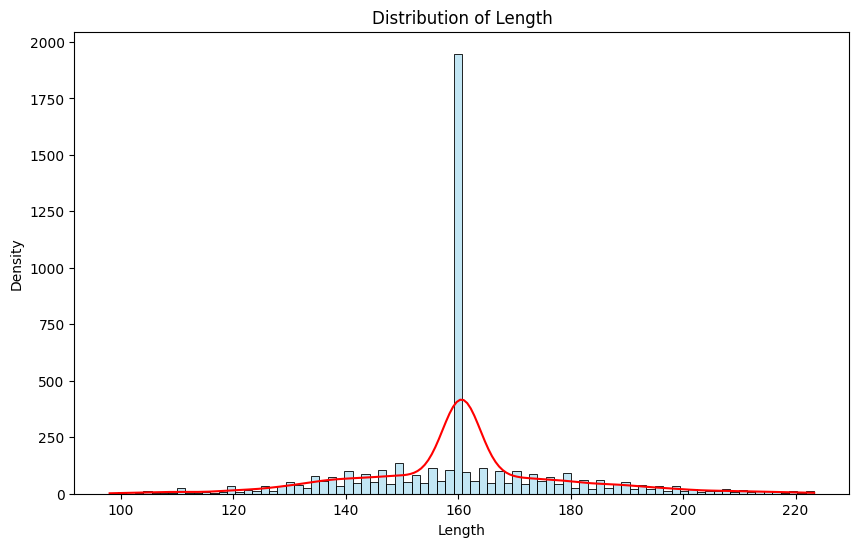

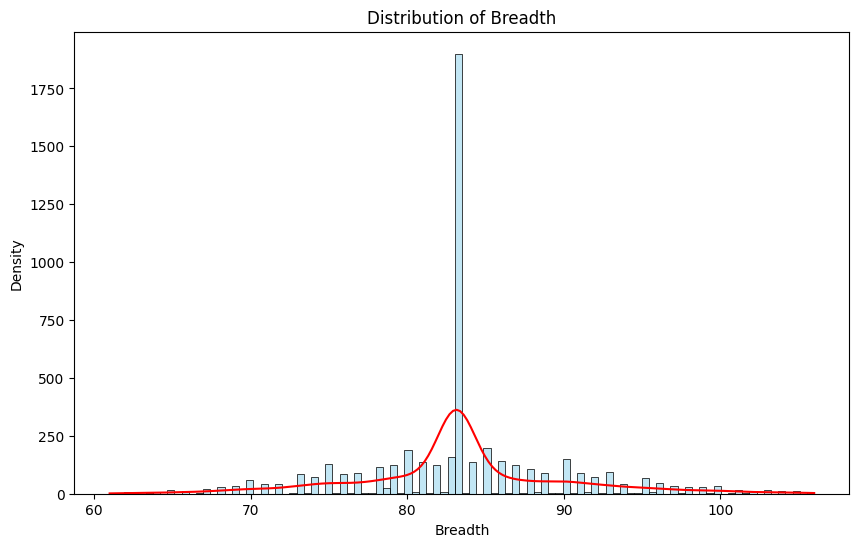

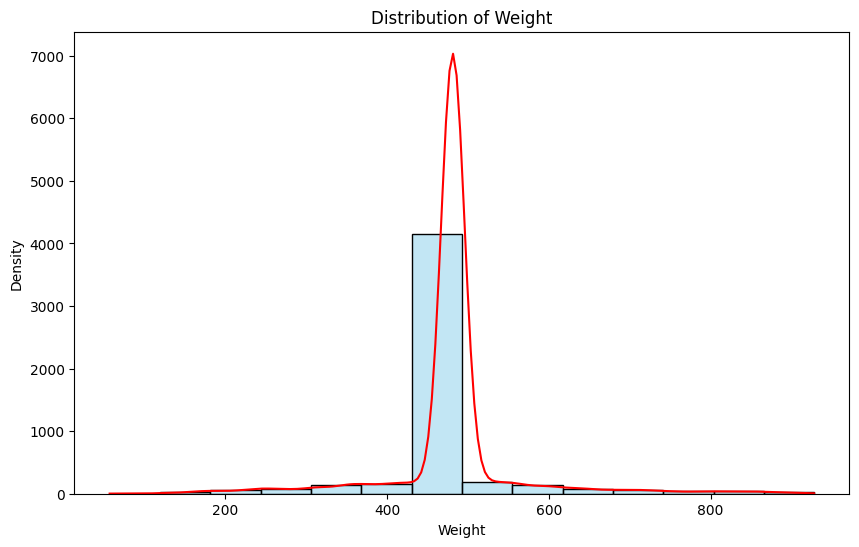

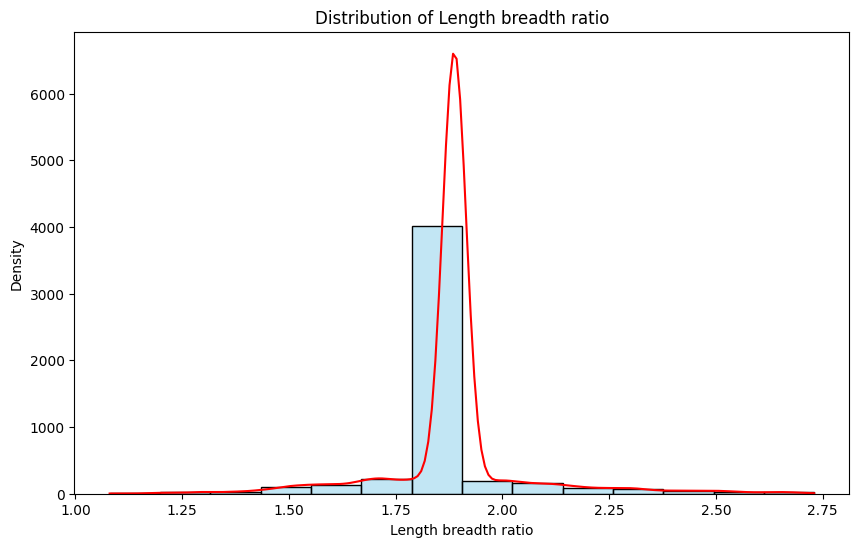

In [ ]:
# Let's use the function

numeric_plot_graph(df_copy_3, numeric_columns)

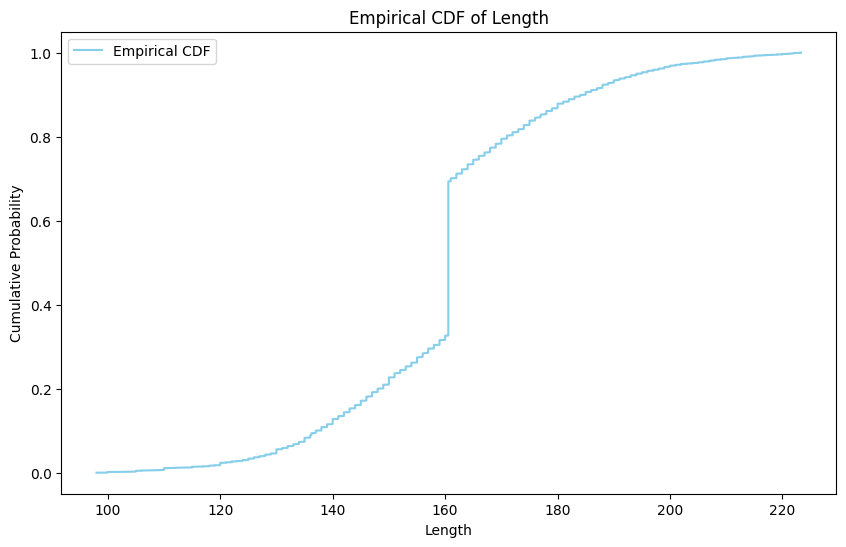

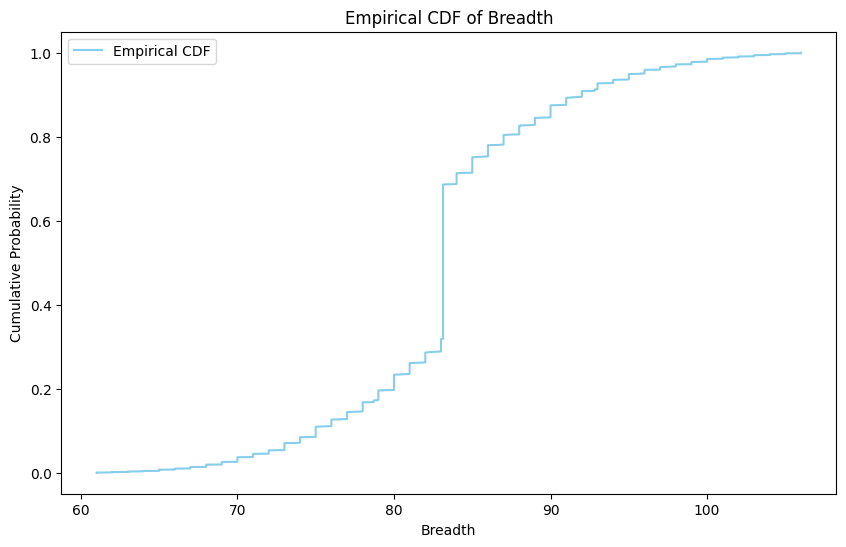

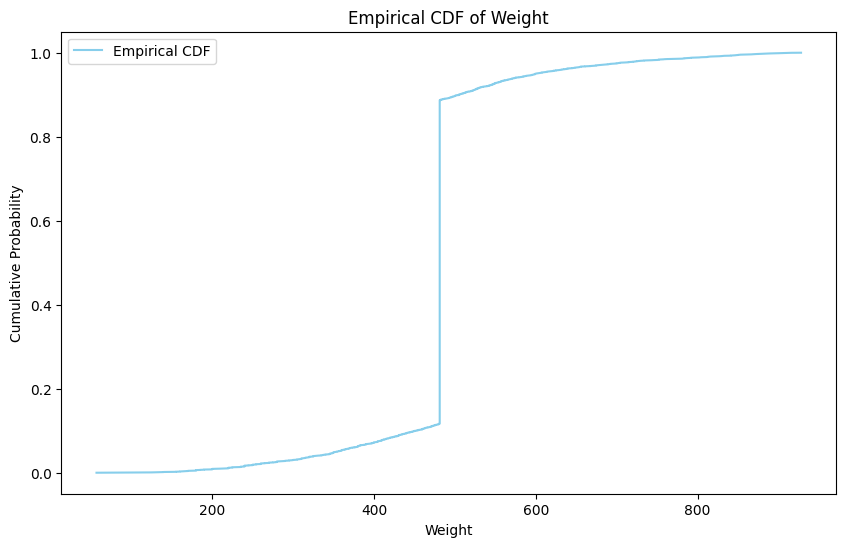

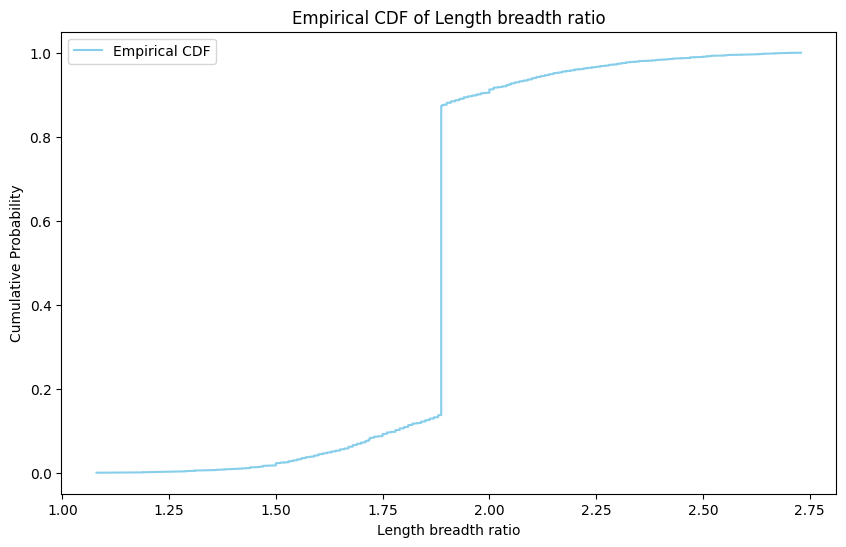

In [ ]:
# Let's use the function

numeric_plot_graph_2(df_copy_3, numeric_columns)

We'll continue with categorical columns

In [ ]:
# Let's define the categorical columns

categorical_columns = df_copy_3.copy()[df_copy_3.select_dtypes(include='object').columns]

# Exclude specific columns
exclude_columns = ["Info", "Clone name + Refcode"]
categorical_columns = [col for col in categorical_columns if col not in exclude_columns]

<ipython-input-293-96e390e00927>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=column, palette='pastel')


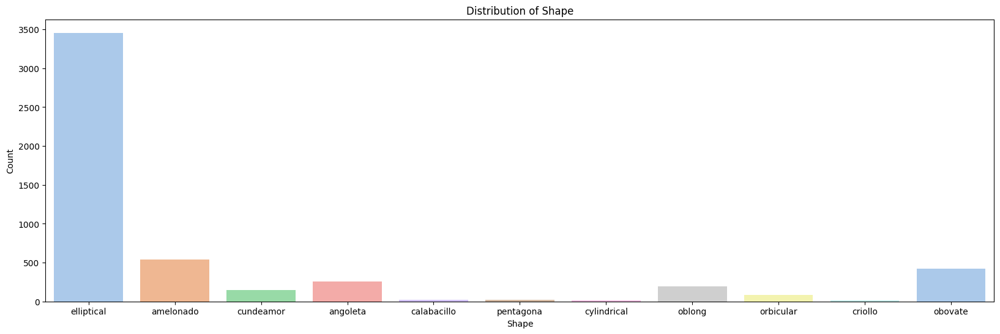

<ipython-input-293-96e390e00927>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=column, palette='pastel')


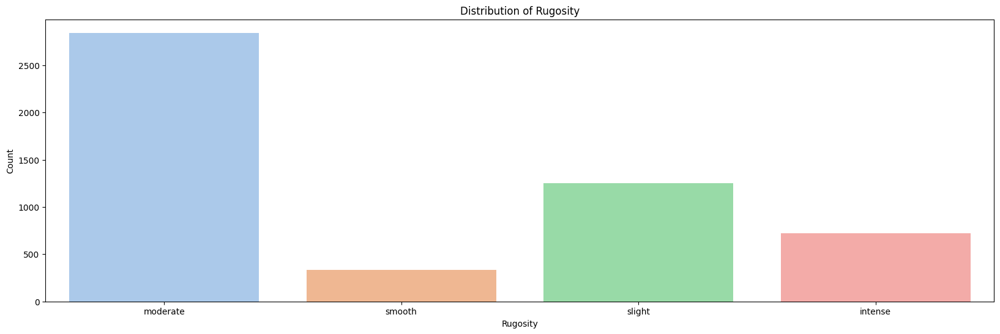

<ipython-input-293-96e390e00927>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=column, palette='pastel')


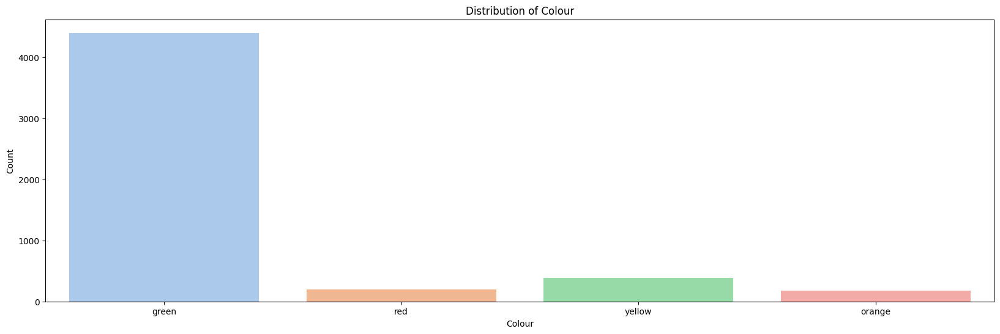

<ipython-input-293-96e390e00927>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=column, palette='pastel')


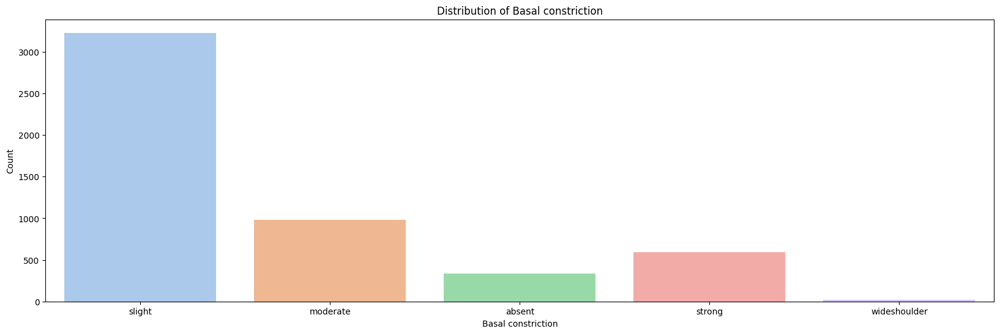

<ipython-input-293-96e390e00927>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=column, palette='pastel')


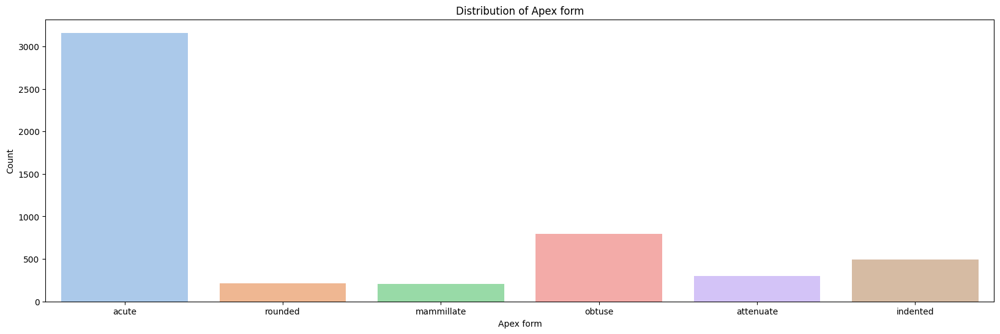

<ipython-input-293-96e390e00927>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=column, palette='pastel')


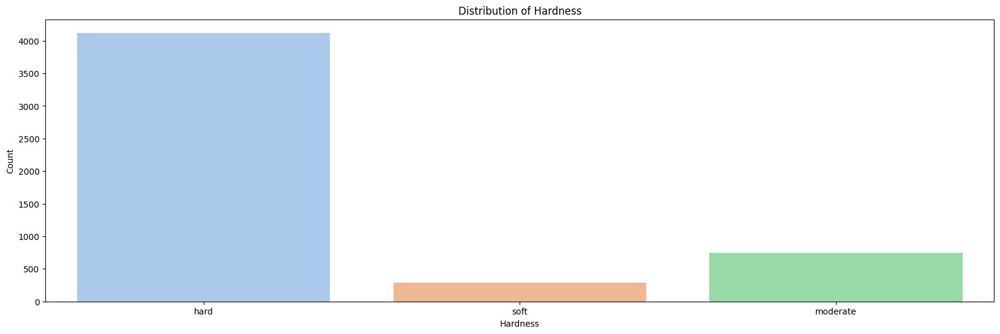

<ipython-input-293-96e390e00927>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=column, palette='pastel')


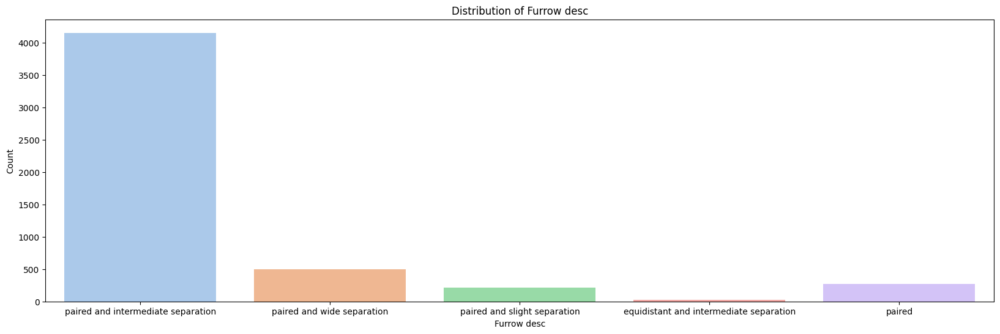

In [ ]:
# Let's use the function

categorical_plot_graph(df_copy_3, categorical_columns)

Let's explore boxplot to visualize the data

<Axes: xlabel='Hardness', ylabel='Length'>

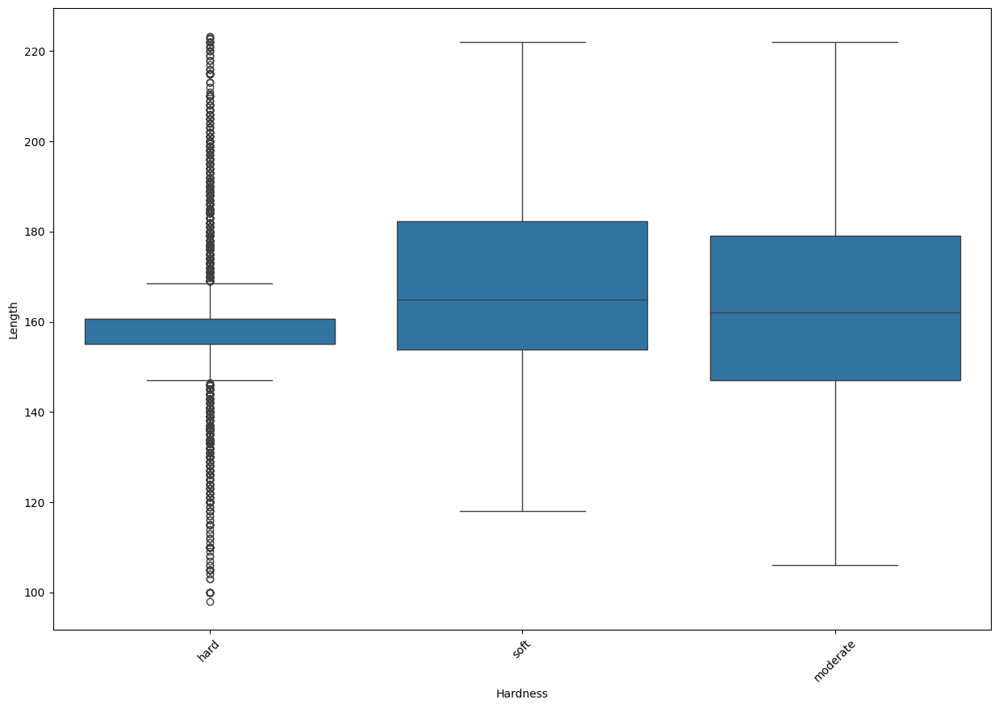

In [ ]:
plt.figure(figsize=(15,10))
plt.xticks(rotation=45)
sns.boxplot(data=df_copy_3, x="Hardness", y="Length")

<Axes: xlabel='Hardness', ylabel='Weight'>

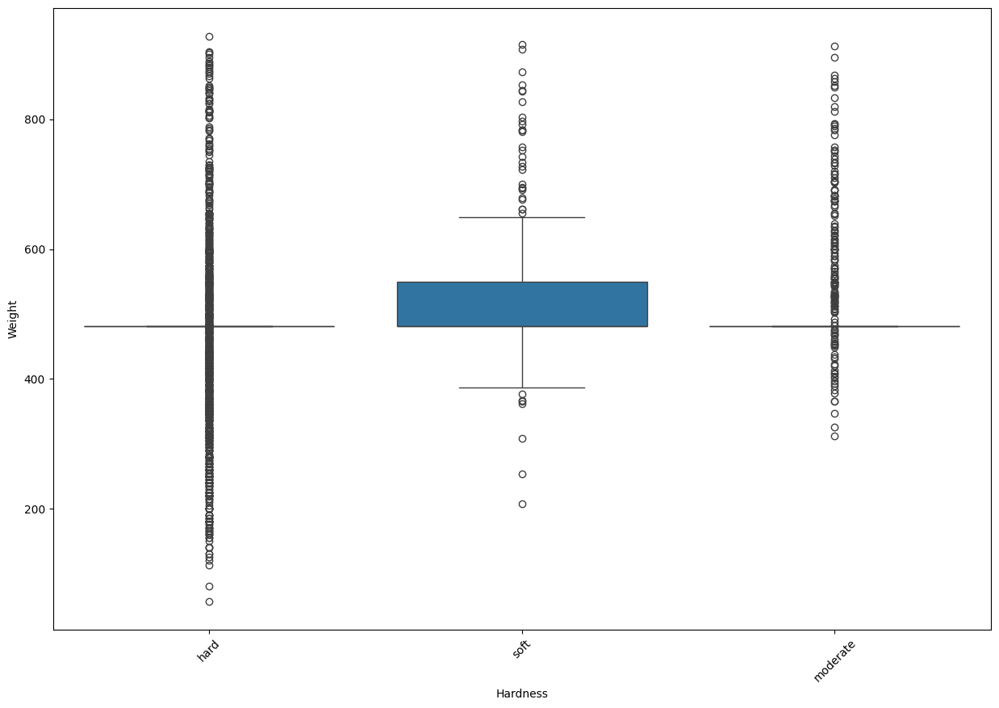

In [ ]:
plt.figure(figsize=(15,10))
plt.xticks(rotation=45)
sns.boxplot(data=df_copy_3, x="Hardness", y="Weight")

<Axes: xlabel='Hardness', ylabel='Breadth'>

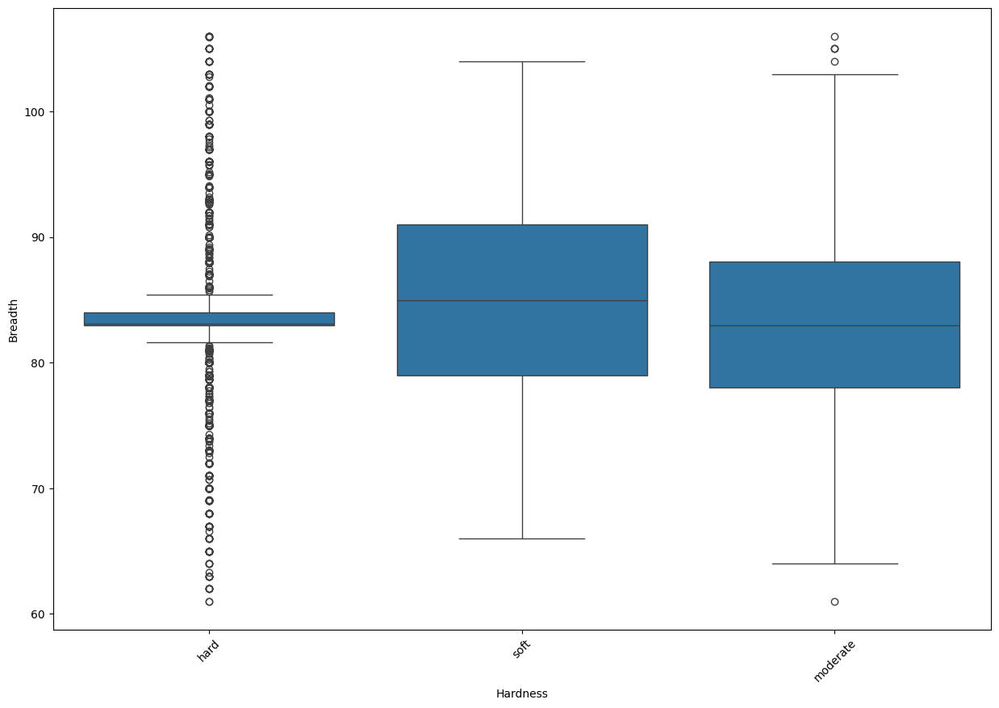

In [ ]:
plt.figure(figsize=(15,10))
plt.xticks(rotation=45)
sns.boxplot(data=df_copy_3, y="Breadth", x="Hardness")

<Axes: xlabel='Furrow desc', ylabel='Breadth'>

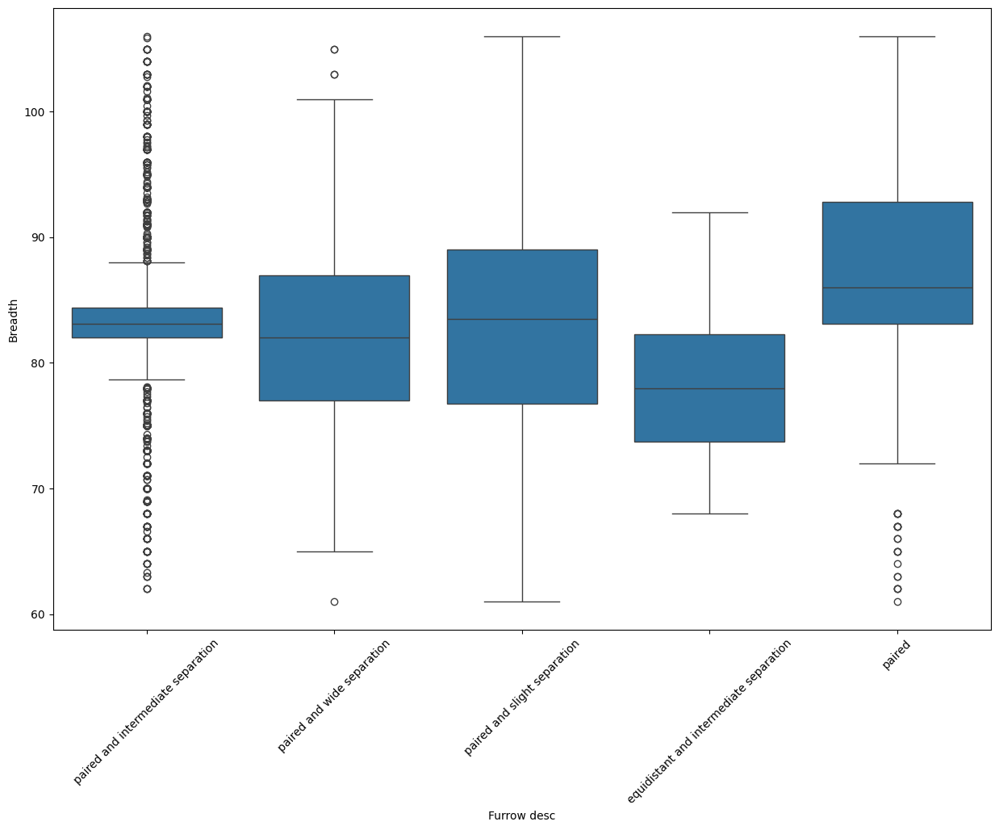

In [ ]:
plt.figure(figsize=(15,10))
plt.xticks(rotation=45)
sns.boxplot(data=df_copy_3, y="Breadth", x="Furrow desc")

<Axes: xlabel='Furrow desc', ylabel='Length'>

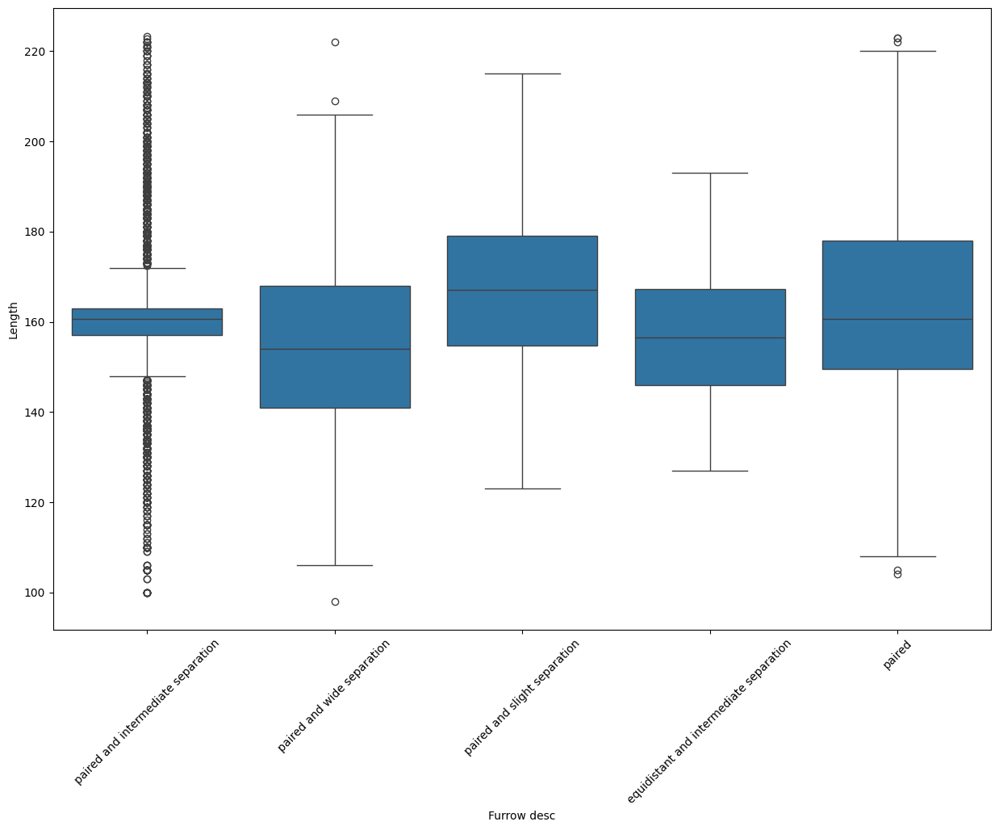

In [ ]:
plt.figure(figsize=(15,10))
plt.xticks(rotation=45)
sns.boxplot(data=df_copy_3, y="Length", x="Furrow desc")

<Axes: xlabel='Furrow desc', ylabel='Weight'>

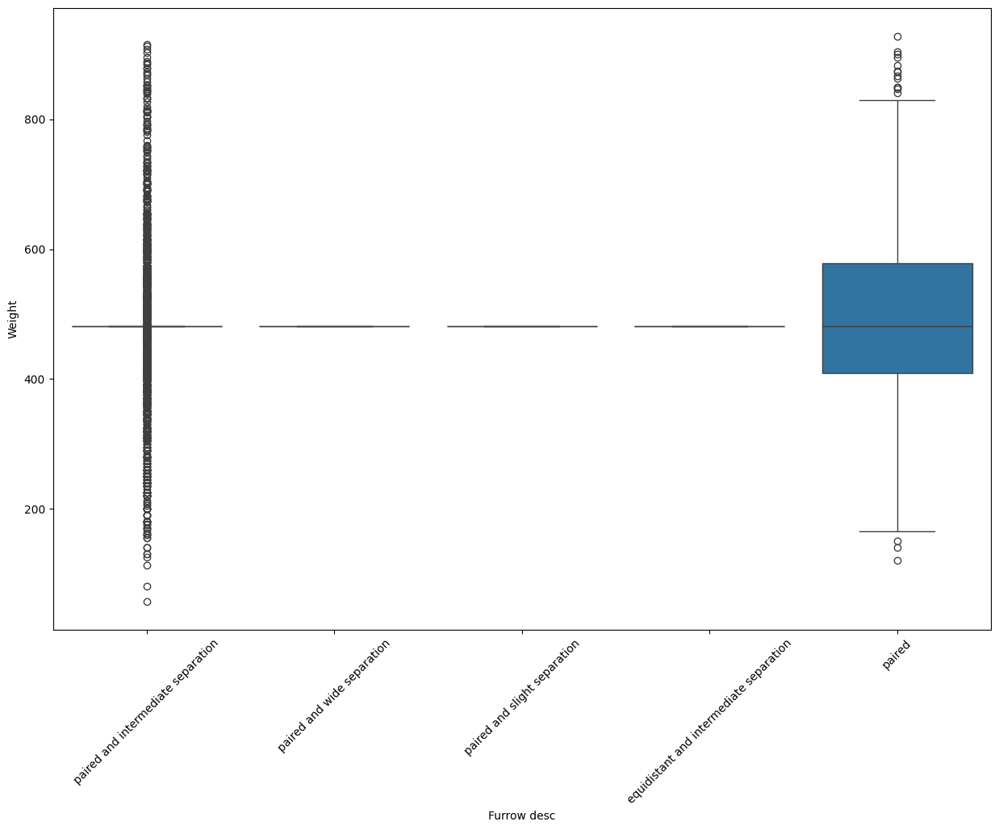

In [ ]:
plt.figure(figsize=(15,10))
plt.xticks(rotation=45)
sns.boxplot(data=df_copy_3, y="Weight", x="Furrow desc")

<Axes: xlabel='Rugosity', ylabel='Length'>

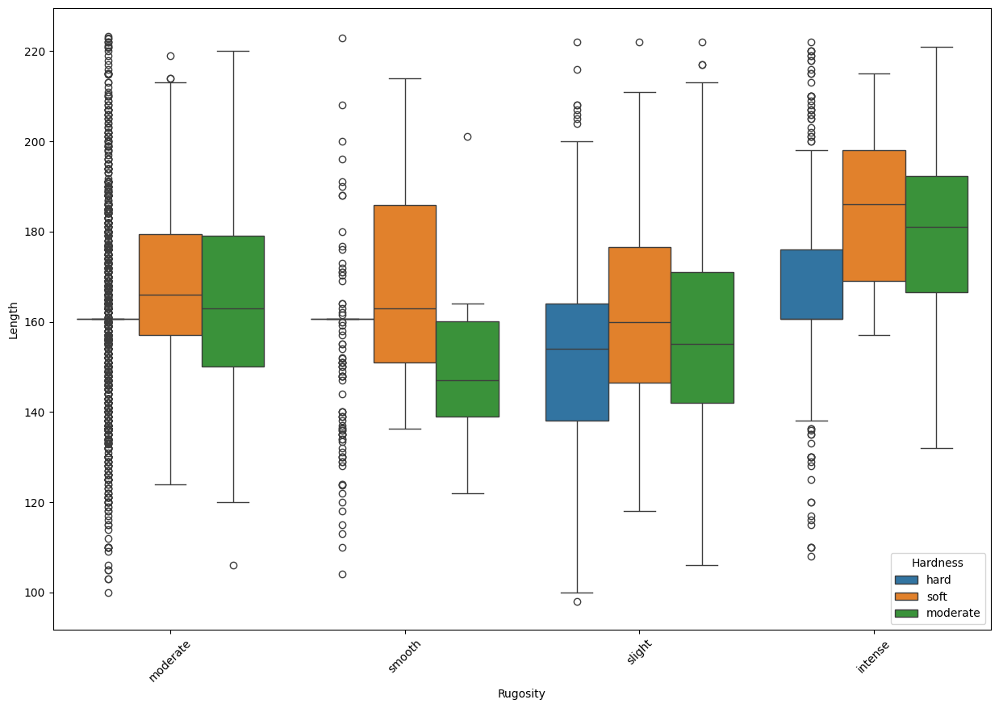

In [ ]:
plt.figure(figsize=(15,10))
plt.xticks(rotation=45)
sns.boxplot(data=df_copy_3, y="Length", x="Rugosity", hue="Hardness")

<Axes: xlabel='Rugosity', ylabel='Weight'>

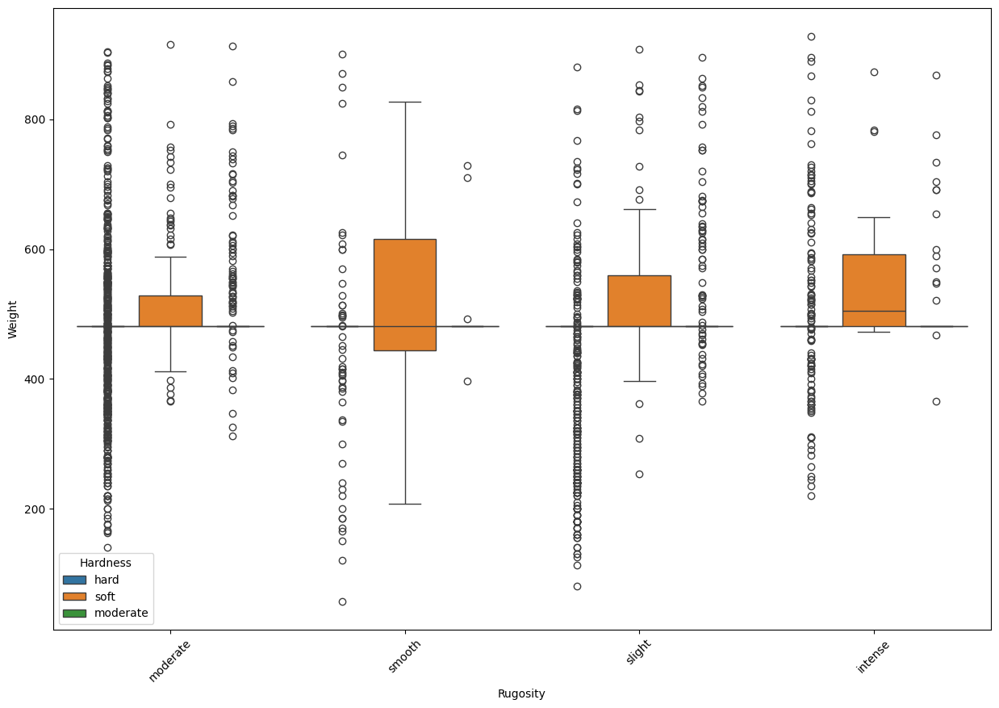

In [ ]:
plt.figure(figsize=(15,10))
plt.xticks(rotation=45)
sns.boxplot(data=df_copy_3, y="Weight", x="Rugosity", hue="Hardness")

<Axes: xlabel='Rugosity', ylabel='Breadth'>

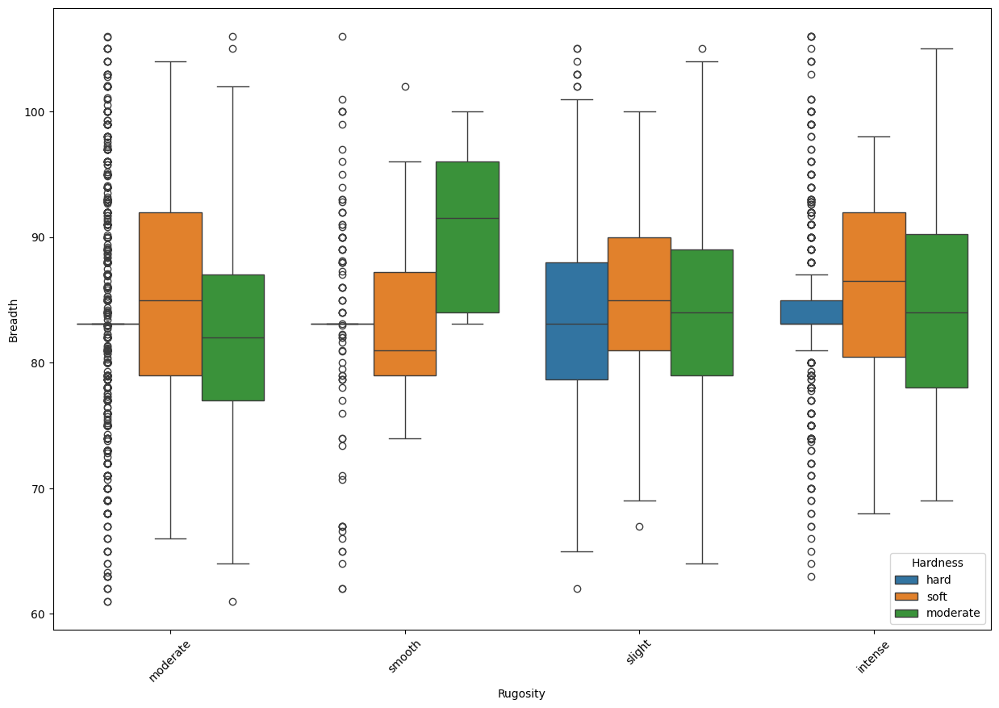

In [ ]:
plt.figure(figsize=(15,10))
plt.xticks(rotation=45)
sns.boxplot(data=df_copy_3, y="Breadth", x="Rugosity", hue="Hardness")

### **Let's check the correlations between the features**

In [ ]:
correlation_matrix = df_copy_3.corr()

# Display the correlation matrix
print(correlation_matrix)

                        Length   Breadth    Weight  Length breadth ratio
Length                1.000000  0.424407  0.547206              0.560018
Breadth               0.424407  1.000000  0.429534             -0.034573
Weight                0.547206  0.429534  1.000000              0.402653
Length breadth ratio  0.560018 -0.034573  0.402653              1.000000


<ipython-input-368-9d789cc0efe0>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df_copy_3.corr()


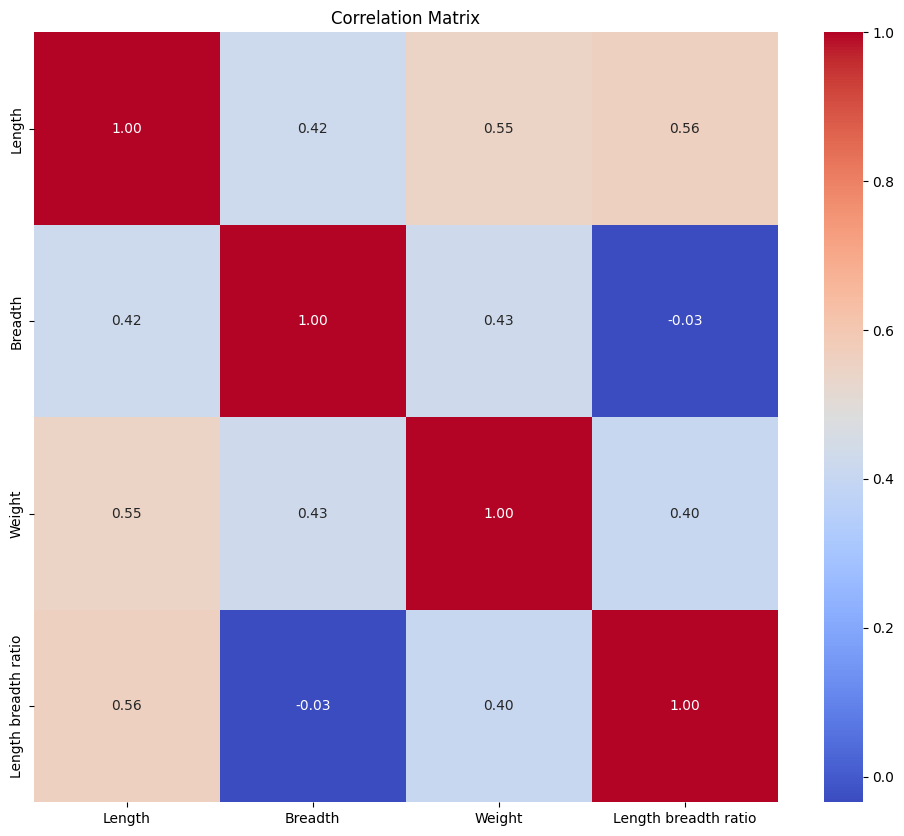

In [ ]:
# Create a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")

plt.title('Correlation Matrix')
plt.show()

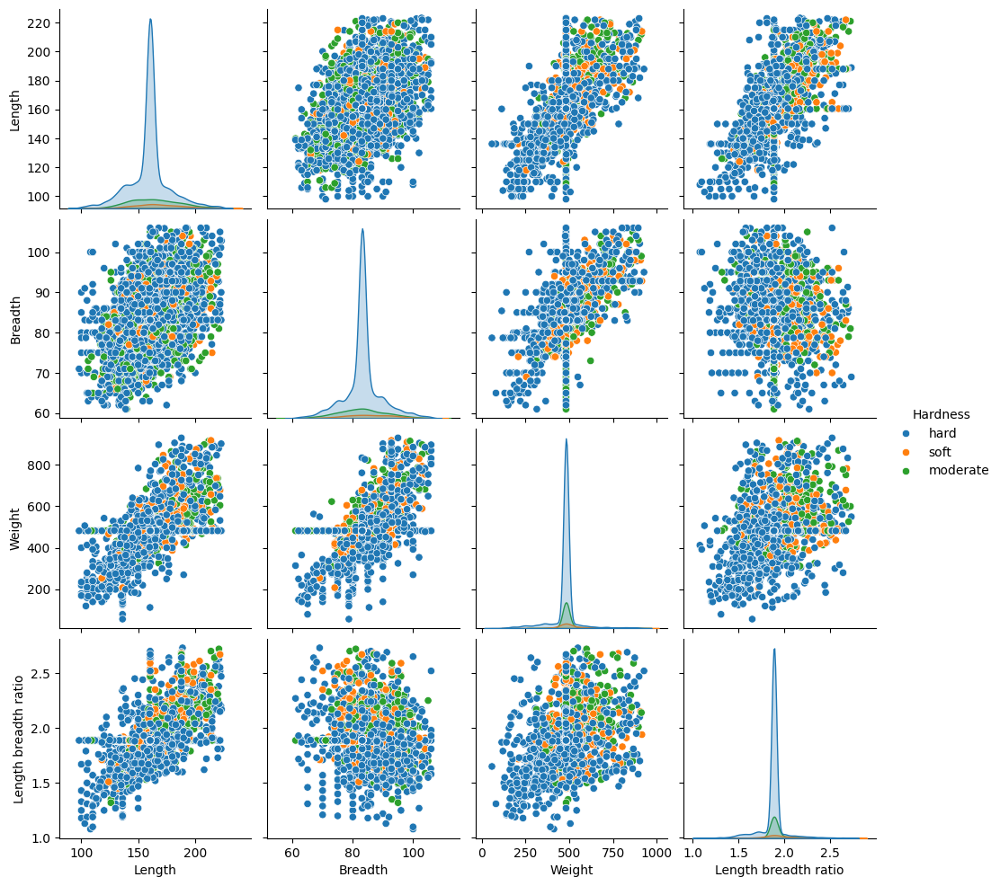

In [ ]:
sns.pairplot(df_copy_3, diag_kind='kde', hue='Hardness', vars=['Length', 'Breadth', 'Weight', 'Length breadth ratio'])
plt.show()

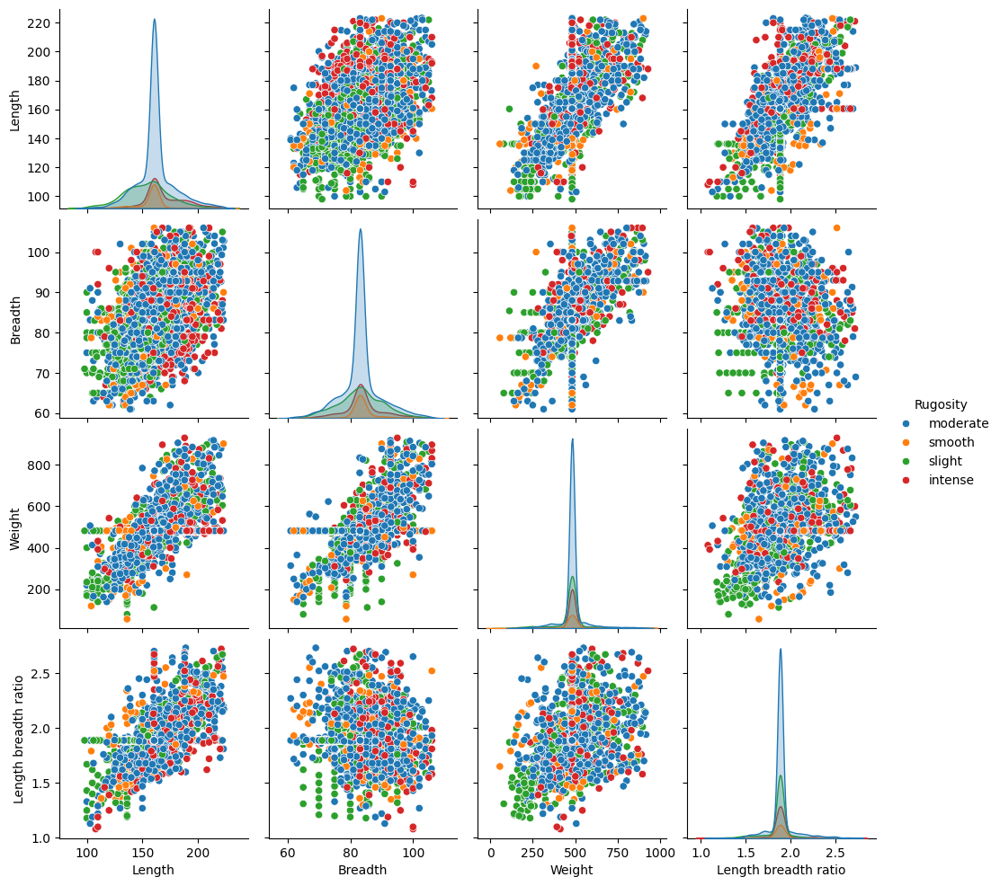

In [ ]:
sns.pairplot(df_copy_3, diag_kind='kde', hue='Rugosity', vars=['Length', 'Breadth', 'Weight', 'Length breadth ratio'])
plt.show()

### **Let's examin a paretto chart for the categorical columns**

In [ ]:
def pareto_chart(df, column):
    # Count the frequency of each category
    counts = df[column].value_counts()

    # Calculate the cumulative percentage
    cumulative_percentage = counts.cumsum() / counts.sum() * 100

    # Sort the categories by frequency in descending order
    counts_sorted = counts.sort_values(ascending=False)
    cumulative_percentage_sorted = cumulative_percentage[counts_sorted.index]

    # Create the Pareto chart
    fig, ax1 = plt.subplots()

    ax1.bar(counts_sorted.index, counts_sorted, color='b')
    ax1.set_ylabel('Frequency', color='b')
    ax1.tick_params('y', colors='b')

    ax2 = ax1.twinx()
    ax2.plot(counts_sorted.index, cumulative_percentage_sorted, color='r', marker='o')
    ax2.set_ylabel('Cumulative Percentage', color='r')
    ax2.tick_params('y', colors='r')

    ax1.set_xticklabels(counts_sorted.index, rotation=90)  # Rotate x-axis labels for better visibility

    plt.title(f"Pareto Chart for {column}")
    plt.show()

In [ ]:
print(categorical_columns)

['Shape', 'Rugosity', 'Colour', 'Basal constriction', 'Apex form', 'Hardness', 'Furrow desc']


<ipython-input-372-c9408ec0fe5d>:24: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(counts_sorted.index, rotation=90)  # Rotate x-axis labels for better visibility


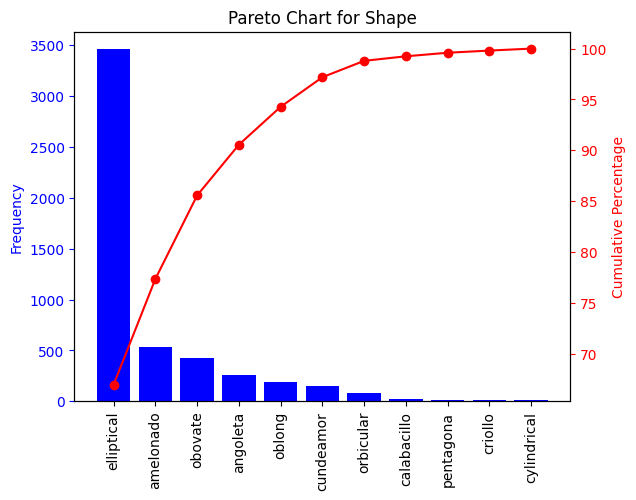

<ipython-input-372-c9408ec0fe5d>:24: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(counts_sorted.index, rotation=90)  # Rotate x-axis labels for better visibility


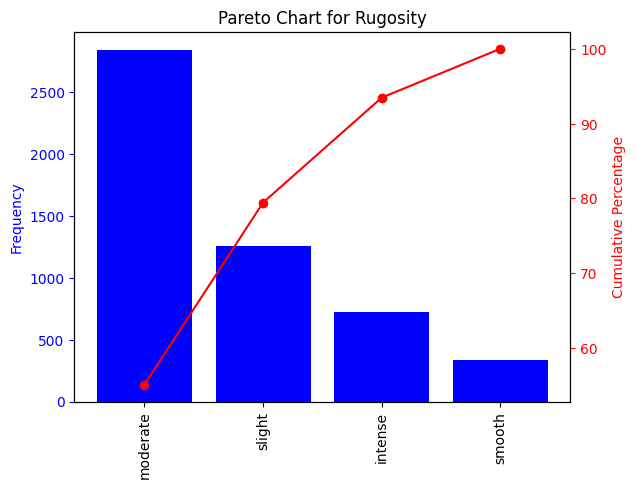

<ipython-input-372-c9408ec0fe5d>:24: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(counts_sorted.index, rotation=90)  # Rotate x-axis labels for better visibility


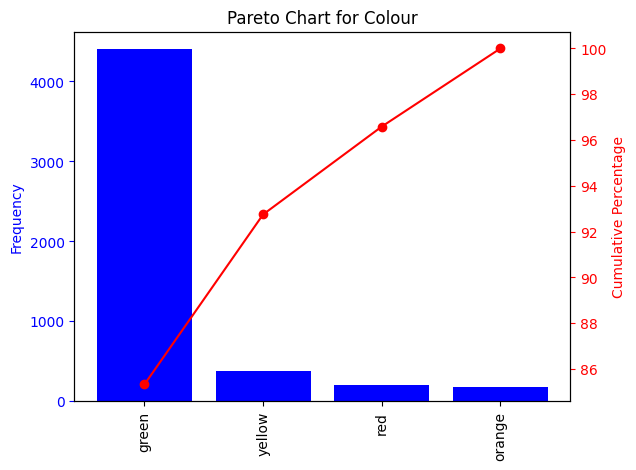

<ipython-input-372-c9408ec0fe5d>:24: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(counts_sorted.index, rotation=90)  # Rotate x-axis labels for better visibility


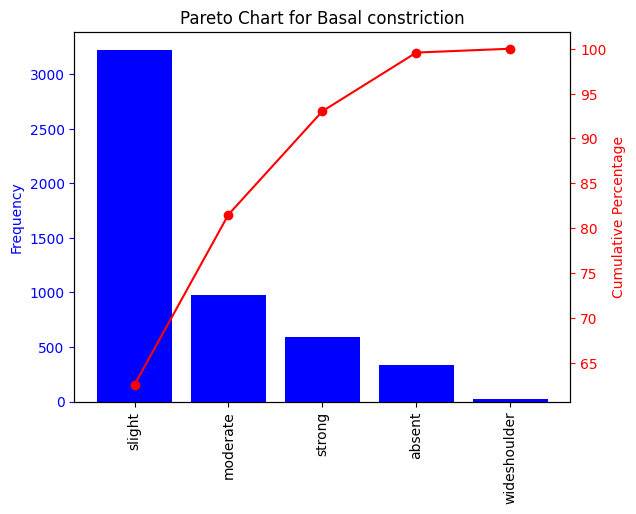

<ipython-input-372-c9408ec0fe5d>:24: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(counts_sorted.index, rotation=90)  # Rotate x-axis labels for better visibility


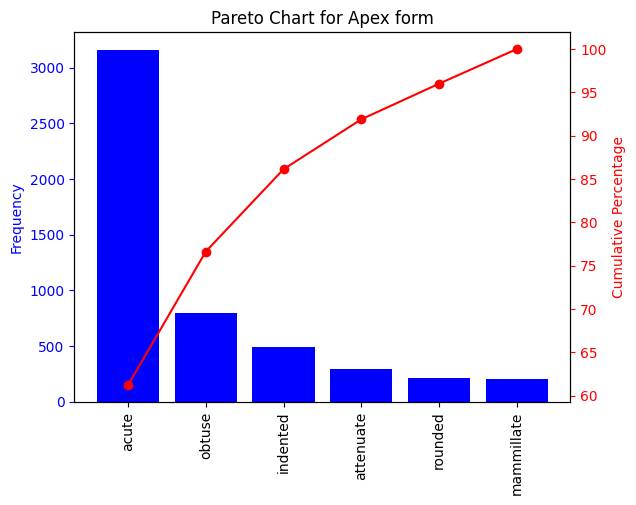

<ipython-input-372-c9408ec0fe5d>:24: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(counts_sorted.index, rotation=90)  # Rotate x-axis labels for better visibility


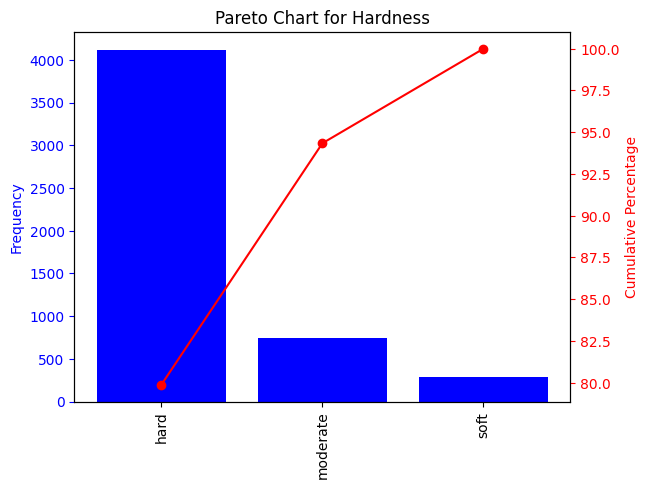

<ipython-input-372-c9408ec0fe5d>:24: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(counts_sorted.index, rotation=90)  # Rotate x-axis labels for better visibility


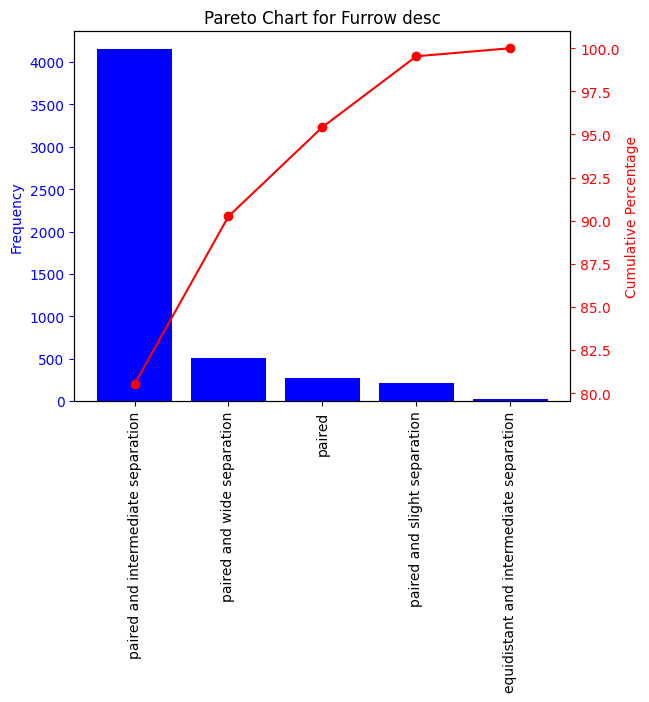

In [ ]:
# Let's generate a paretto chart for each categorical column

for column in categorical_columns:
    pareto_chart(df_copy_1, column)

## **Last check on the content and exporting the file as csv**

In [ ]:
df_copy_3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5159 entries, 0 to 5158
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Length                5159 non-null   float64
 1   Breadth               5159 non-null   float64
 2   Weight                5159 non-null   float64
 3   Length breadth ratio  5159 non-null   float64
 4   Shape                 5159 non-null   object 
 5   Rugosity              5159 non-null   object 
 6   Colour                5159 non-null   object 
 7   Basal constriction    5159 non-null   object 
 8   Apex form             5159 non-null   object 
 9   Hardness              5159 non-null   object 
 10  Info                  2128 non-null   object 
 11  Furrow desc           5159 non-null   object 
 12  Clone name + Refcode  5159 non-null   object 
dtypes: float64(4), object(9)
memory usage: 524.1+ KB


In [ ]:
df_copy_3.head()

,Length,Breadth,Weight,Length breadth ratio,Shape,Rugosity,Colour,Basal constriction,Apex form,Hardness,Info,Furrow desc,Clone name + Refcode
0,156.1,76.400000,382.2,2.0000,elliptical,moderate,green,slight,acute,hard,NaN,paired and intermediate separation,AMAZ 15 /15_PAL92A
1,140.8,88.600000,460.9,1.6000,elliptical,moderate,green,slight,acute,hard,NaN,paired and intermediate separation,AMAZ 2 /1_PAL92A
2,154.8,88.900000,548.0,1.7000,elliptical,moderate,green,slight,acute,hard,NaN,paired and intermediate separation,APA 4_PAL92A
3,172.7,83.133355,490.4,1.8873,elliptical,moderate,green,slight,acute,hard,NaN,paired and intermediate separation,BE 10_PAL92A
4,171.3,84.200000,543.2,2.0000,elliptical,moderate,green,slight,acute,hard,NaN,paired and intermediate separation,CAS 1_PAL92A


In [ ]:
# Exporting the dataframe as csv
df_copy_3.to_csv('fruit_v3.csv', index=False)